# Predicting capacity_mw (Regression Problem)

In [345]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso, Ridge
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import OrdinalEncoder
import pickle

import warnings
warnings.filterwarnings('ignore')

In [346]:
# Import Australia dataset
AUS =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Global%20Power%20Plant%20Database/database_AUS.csv')
AUS.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,AUS0000433,0.11,-34.9387,138.5377,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,AUS0000432,1.00,-34.9453,138.5882,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,AUS0000065,21.60,-35.0641,117.7977,Wind,NaN,NaN,...,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,92.682222,NaN,Australia Clean Energy Regulator,NaN
3,AUS,Australia,Alice Springs Airport,AUS0000469,0.24,-23.7966,133.8971,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,AUS0000231,4.00,-34.5509,138.7659,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,AUS,Australia,Angaston,AUS0000232,50.00,-34.5034,139.0246,Oil,NaN,NaN,...,2019.0,NaN,NaN,1.653056,5.300833,7.649722,2.222222,NaN,Australia Clean Energy Regulator,NaN
6,AUS,Australia,Anglesea,AUS0000114,165.00,-38.3861,144.1828,Coal,NaN,NaN,...,2019.0,1095.676944,1239.962778,1260.261111,167.880000,NaN,NaN,NaN,Australia Clean Energy Regulator,NaN
7,AUS,Australia,Angurugu,AUS0000615,3.60,-13.8584,136.4209,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,AUS,Australia,Appin (Mine),AUS0000264,55.60,-34.2082,150.7722,Gas,NaN,NaN,...,2019.0,204.804444,238.294444,163.583611,158.933056,64.534722,99.470000,NaN,Australia Clean Energy Regulator,NaN
9,AUS,Australia,Ararat Wind Farm,AUS0000611,240.00,-37.2385,143.0794,Wind,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [347]:
# Importing India dataset
IND =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Global%20Power%20Plant%20Database/database_IND.csv')
IND.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,2.41461,617.789264,843.7470,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.3700,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,1.52800,1153.421000,1208.8520,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
6,IND,India,ALIYAR,IND0000004,60.0,10.4547,77.0078,Hydro,NaN,NaN,...,2019.0,5.03600,157.558250,152.1952,61.421350,89.629600,48.327150,NaN,Central Electricity Authority,NaN
7,IND,India,ALLAIN DUHANGAN,IND0000005,192.0,32.2258,77.2070,Hydro,NaN,NaN,...,2019.0,0.21500,674.391100,721.3352,675.724400,679.594950,579.318850,NaN,Central Electricity Authority,NaN
8,IND,India,ALMATTI DAM,IND0000006,290.0,16.3300,75.8863,Hydro,NaN,NaN,...,2019.0,NaN,480.594950,144.4342,402.029750,439.372100,406.377900,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.0460,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN


In [348]:
#importing USA dataset
USA =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Global%20Power%20Plant%20Database/database_USA.csv')
USA.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,USA,United States of America,10 Briggs Solar NG LLC (East),USA0062781,0.0,41.6327,-71.4963,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USA,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,2.467,U.S. Energy Information Administration,NaN
2,USA,United States of America,1001 Ebenezer Church Solar,USA0063444,0.0,36.2838,-80.8434,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USA,United States of America,1008 Matthews Solar,USA0063447,0.0,36.2167,-80.5525,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USA,United States of America,1009 Yadkin Solar,USA0063445,0.0,36.1475,-80.6561,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,USA,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,1.332,U.S. Energy Information Administration,NaN
6,USA,United States of America,1045 Tomlin Mill Solar,USA0063448,0.0,35.9162,-80.8355,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,USA,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,1.417,U.S. Energy Information Administration,NaN
8,USA,United States of America,1073 Onslow Solar,USA0063446,0.0,34.7736,-77.1858,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,USA,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,NaN,NaN,...,2019.0,2.41461,2.35,2.43,2.492,2.276,2.207,2.349,U.S. Energy Information Administration,NaN


In [349]:
AUS.shape

(512, 27)

In [350]:
IND.shape

(907, 27)

In [351]:
USA.shape

(11879, 27)

In [352]:
df =pd.concat([AUS, IND, USA], axis =0)

In [353]:
df

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,AUS0000433,0.11,-34.9387,138.5377,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,AUS0000432,1.00,-34.9453,138.5882,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,AUS0000065,21.60,-35.0641,117.7977,Wind,NaN,NaN,...,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,92.682222,NaN,Australia Clean Energy Regulator,NaN
3,AUS,Australia,Alice Springs Airport,AUS0000469,0.24,-23.7966,133.8971,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,AUS0000231,4.00,-34.5509,138.7659,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11874,USA,United States of America,Zotos International WPGF,USA0057648,3.40,42.8869,-76.9683,Wind,NaN,NaN,...,2019.0,3.671000,2.460150,2.489000,1.670000,1.233490,2.630000,1.211,U.S. Energy Information Administration,NaN
11875,USA,United States of America,Zumbro Community Solar Garden,USA0061574,1.00,44.3195,-92.6703,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,1.161000,1.589,U.S. Energy Information Administration,NaN
11876,USA,United States of America,Zumbro Solar Garden,USA0063426,0.00,44.0460,-92.7600,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11877,USA,United States of America,Zuni,USA0000478,0.00,39.7373,-105.0170,NaN,NaN,NaN,...,2019.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,U.S. Energy Information Administration,NaN


In [354]:
# Checking Duplicate Records
print("No. of duplicate Records :", df.duplicated().sum())

No. of duplicate Records : 0


In [355]:
df.describe()

,capacity_mw,latitude,longitude,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,estimated_generation_gwh
count,13292.000000,13220.000000,13220.000000,10654.000000,0.0,12860.0,7170.000000,7534.000000,7993.000000,8701.000000,9292.000000,9858.000000,0.0
mean,117.738717,35.053213,-73.794217,1998.184904,NaN,2019.0,563.383222,635.739731,616.801877,561.784508,532.472482,513.679016,NaN
std,347.169038,15.444195,62.868834,24.017781,NaN,0.0,2030.523760,2193.172655,2148.167470,2050.411295,2001.411908,1963.485305,NaN
min,0.000000,-42.888300,-171.712400,1896.000000,NaN,2019.0,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000,NaN
25%,1.500000,33.901700,-104.659875,1988.000000,NaN,2019.0,1.653075,2.018000,2.140000,2.108000,2.063750,2.141250,NaN
50%,5.500000,38.389750,-87.346000,2008.000000,NaN,2019.0,21.384500,22.241000,19.504000,15.410278,13.433861,12.308500,NaN
75%,52.725000,42.175125,-75.475925,2015.000000,NaN,2019.0,185.326498,217.069500,200.279000,173.348004,157.889688,149.141249,NaN
max,6809.000000,425.246100,153.434100,2020.000000,NaN,2019.0,31431.080000,32320.917000,32525.595000,32377.477000,35116.000000,35136.000000,NaN


In [356]:
df.isnull().sum()

country                         0
country_long                    0
name                            0
gppd_idnr                       0
capacity_mw                     6
latitude                       78
longitude                      78
primary_fuel                 2004
other_fuel1                 11670
other_fuel2                 13028
other_fuel3                 13206
commissioning_year           2644
owner                         593
source                          0
url                             0
geolocation_source             23
wepp_id                     13298
year_of_capacity_data         438
generation_gwh_2013          6128
generation_gwh_2014          5764
generation_gwh_2015          5305
generation_gwh_2016          4597
generation_gwh_2017          4006
generation_gwh_2018          3440
generation_gwh_2019          3520
generation_data_source       2463
estimated_generation_gwh    13298
dtype: int64

In [357]:
# Deleting wepp_id, as there is not data in the column
df.drop(columns =['wepp_id'], inplace =True)

In [358]:
# There is some null values present in target variable. We will delete it.
df.dropna(subset =['capacity_mw'], inplace =True)

In [359]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13292 entries, 0 to 11878
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   13292 non-null  object 
 1   country_long              13292 non-null  object 
 2   name                      13292 non-null  object 
 3   gppd_idnr                 13292 non-null  object 
 4   capacity_mw               13292 non-null  float64
 5   latitude                  13214 non-null  float64
 6   longitude                 13214 non-null  float64
 7   primary_fuel              11288 non-null  object 
 8   other_fuel1               1628 non-null   object 
 9   other_fuel2               270 non-null    object 
 10  other_fuel3               92 non-null     object 
 11  commissioning_year        10648 non-null  float64
 12  owner                     12701 non-null  object 
 13  source                    13292 non-null  object 
 14  url        

In [360]:
df[df['primary_fuel'].isnull()]

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,USA,United States of America,10 Briggs Solar NG LLC (East),USA0062781,0.0,41.6327,-71.4963,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,USA,United States of America,1001 Ebenezer Church Solar,USA0063444,0.0,36.2838,-80.8434,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USA,United States of America,1008 Matthews Solar,USA0063447,0.0,36.2167,-80.5525,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USA,United States of America,1009 Yadkin Solar,USA0063445,0.0,36.1475,-80.6561,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,USA,United States of America,1045 Tomlin Mill Solar,USA0063448,0.0,35.9162,-80.8355,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11852,USA,United States of America,Yorktown Battery Energy Storage Facility,USA0063325,0.0,34.0047,-118.0684,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11858,USA,United States of America,Yum Yum Solar LLC,USA0063026,0.0,35.2525,-89.2514,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11868,USA,United States of America,Zephyr Wind Project - 2.0,USA0062653,0.0,41.0931,-83.6378,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,U.S. Energy Information Administration,NaN
11876,USA,United States of America,Zumbro Solar Garden,USA0063426,0.0,44.0460,-92.7600,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [361]:
# Checking count of each column
for i in df:
    print(df[i].value_counts())

country
USA    11879
IND      907
AUS      506
Name: count, dtype: int64
country_long
United States of America    11879
India                         907
Australia                     506
Name: count, dtype: int64
name
Richland                       3
Bear Creek Solar               2
Costa Sur                      2
Newport                        2
Scarlet Solar                  2
                              ..
E&B Resources                  1
E-Volve Energy Holdings LLC    1
E. Goenner Project CSG         1
E.B. Eddy Paper Inc            1
eBay - South Jordan            1
Name: count, Length: 13260, dtype: int64
gppd_idnr
AUS0000433    1
USA0062244    1
USA0061333    1
USA0062243    1
USA0062252    1
             ..
USA0000260    1
USA0006211    1
USA0007897    1
USA0000026    1
USA0059281    1
Name: count, Length: 13292, dtype: int64
capacity_mw
0.0      2030
5.0       552
1.0       534
2.0       479
1.5       267
         ... 
772.0       1
119.1       1
251.8       1
153.9       

In [362]:
# Deleting primary fuel with null value
df.dropna(subset =['primary_fuel'], inplace =True)

In [363]:
df.isnull().sum()

country                         0
country_long                    0
name                            0
gppd_idnr                       0
capacity_mw                     0
latitude                       50
longitude                      50
primary_fuel                    0
other_fuel1                  9660
other_fuel2                 11018
other_fuel3                 11196
commissioning_year            640
owner                         591
source                          0
url                             0
geolocation_source             23
year_of_capacity_data         438
generation_gwh_2013          4431
generation_gwh_2014          4031
generation_gwh_2015          3545
generation_gwh_2016          2791
generation_gwh_2017          2168
generation_gwh_2018          1578
generation_gwh_2019          1620
generation_data_source        791
estimated_generation_gwh    11288
dtype: int64

In [364]:
df[df['other_fuel1'].notnull()]

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.370000,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,1.528000,1153.421000,1208.852000,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.046000,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN
10,IND,India,AMARAVATI TPP,IND0000008,1350.0,21.0782,77.9009,Coal,Oil,NaN,...,2019.0,2.741000,1920.971000,5629.663000,1701.008000,4350.558000,3717.154000,NaN,Central Electricity Authority,NaN
12,IND,India,"ANAPARA ""C""",IND0000010,1200.0,24.2007,82.8000,Coal,Oil,NaN,...,2019.0,NaN,7744.000000,8076.810500,7902.021600,7940.740000,7873.973000,NaN,Central Electricity Authority,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11835,USA,United States of America,Yellowstone Energy LP,USA0050931,68.0,45.8117,-108.4278,Petcoke,Gas,NaN,...,2019.0,448.668001,404.659999,500.087004,452.014003,459.442997,442.909996,459.719002,U.S. Energy Information Administration,NaN
11846,USA,United States of America,York Energy Center,USA0055524,1449.4,39.7375,-76.3067,Gas,Oil,NaN,...,2019.0,0.000000,2537.263961,1976.570043,1552.401039,1590.270971,1838.909987,5340.573066,U.S. Energy Information Administration,NaN
11857,USA,United States of America,Yucca,USA0000120,425.0,32.7214,-114.7106,Gas,Oil,NaN,...,2019.0,315.526000,347.465998,330.414000,360.704000,312.684998,456.777005,414.041001,U.S. Energy Information Administration,NaN
11864,USA,United States of America,Zeeland,USA0001867,22.3,42.8067,-86.0558,Gas,Oil,NaN,...,2019.0,1.005480,-0.344000,-0.194000,0.050000,0.363000,0.257000,0.269,U.S. Energy Information Administration,NaN


In [365]:
# Checking Primary fuel vs other fuel1 data distribution
cross_tab =pd.crosstab(df['primary_fuel'], df['other_fuel1'], margins =True)
cross_tab

other_fuel1,Biomass,Coal,Cogeneration,Gas,Hydro,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
primary_fuel,,,,,,,,,,,,,
Biomass,0,11,0,39,0,24,0,0,1,0,31,0,106
Coal,0,0,1,58,0,276,2,11,1,0,18,0,367
Cogeneration,0,0,0,5,0,1,1,0,0,0,0,0,7
Gas,13,39,4,0,2,630,7,3,8,4,10,1,721
Geothermal,0,0,0,0,0,0,0,0,3,0,0,0,3
Hydro,0,0,0,0,0,3,0,0,0,0,0,0,3
Nuclear,0,0,0,0,1,4,0,0,0,0,0,0,5
Oil,0,0,0,150,17,0,5,0,3,4,4,5,188
Other,0,1,0,4,0,3,0,0,0,0,0,0,8


__Only 1628 records have other_fuel1 values filled.__

In [366]:
# Checking data distribution of country vs primary_fuel
cross_tab =pd.crosstab(df['country'], df['primary_fuel'], margins =True)
cross_tab

primary_fuel,Biomass,Coal,Cogeneration,Gas,Geothermal,Hydro,Nuclear,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,,,,,,
AUS,25,28,0,140,0,76,0,55,0,0,61,0,50,71,506
IND,50,258,0,69,0,251,9,20,0,0,127,0,0,123,907
USA,155,286,34,1822,65,1456,63,886,16,11,3291,104,545,1141,9875
All,230,572,34,2031,65,1783,72,961,16,11,3479,104,595,1335,11288


In [367]:
# Checking data distribution of country vs other_fuel1
cross_tab =pd.crosstab(df['country'], df['other_fuel1'], margins =True)
cross_tab

other_fuel1,Biomass,Coal,Cogeneration,Gas,Hydro,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,,,,
IND,0,0,1,2,0,195,0,0,0,0,0,0,198
USA,19,71,5,349,20,791,17,15,30,43,63,7,1430
All,19,71,6,351,20,986,17,15,30,43,63,7,1628


__AUS does not have values filled for the column other_fuel1.__

In [368]:
# Checking data distributon country vs other_fuel2
cross_tab =pd.crosstab(df['country'], df['other_fuel2'], margins =True)
cross_tab

other_fuel2,Biomass,Coal,Gas,Hydro,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,,,
IND,0,0,0,0,1,0,0,0,0,0,0,1
USA,18,3,87,6,61,32,4,17,6,31,4,269
All,18,3,87,6,62,32,4,17,6,31,4,270


__IND has only one record filled for other_fuel2.__

In [369]:
cross_tab =pd.crosstab(df['country'], df['other_fuel3'], margins =True)
cross_tab

other_fuel3,Biomass,Gas,Hydro,Oil,Other,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,
USA,13,34,6,5,20,5,2,5,2,92
All,13,34,6,5,20,5,2,5,2,92


__only USA has less than 10% values filled for other_fuel3.__

In [370]:
# We will delete other_fuel1, other_fuel2, , 'other_fuel3', as 90% of in null.
df.drop(columns =['other_fuel1', 'other_fuel2', 'other_fuel3'], inplace =True)

In [371]:
# Checking dataset info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11288 entries, 0 to 11878
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   11288 non-null  object 
 1   country_long              11288 non-null  object 
 2   name                      11288 non-null  object 
 3   gppd_idnr                 11288 non-null  object 
 4   capacity_mw               11288 non-null  float64
 5   latitude                  11238 non-null  float64
 6   longitude                 11238 non-null  float64
 7   primary_fuel              11288 non-null  object 
 8   commissioning_year        10648 non-null  float64
 9   owner                     10697 non-null  object 
 10  source                    11288 non-null  object 
 11  url                       11288 non-null  object 
 12  geolocation_source        11265 non-null  object 
 13  year_of_capacity_data     10850 non-null  float64
 14  generation_

In [372]:
# We will delete generation_data_source, as 100% of data is blank
df.drop(columns =['estimated_generation_gwh'], inplace =True)

In [373]:
cross_tab =pd.crosstab(df['country'], df['year_of_capacity_data'], margins =True)
cross_tab

year_of_capacity_data,2019.0,All
country,,
AUS,502,502
IND,519,519
USA,9829,9829
All,10850,10850


In [374]:
cross_tab =pd.crosstab(df['country'], df['generation_gwh_2013'], margins =True)
cross_tab

generation_gwh_2013,-947.6,-870.822,-468.86,-449.973,-399.794,-321.604,-308.524,-222.347,-202.133,-175.206,...,19542.065,19547.061,19661.975,20487.14,21021.244,21073.181,21658.20078,26718.113,31431.08,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,252
IND,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,446
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6159
All,2,1,1,2,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6857


In [375]:
cross_tab =pd.crosstab(df['country'], df['generation_gwh_2014'], margins =True)
cross_tab

generation_gwh_2014,-989.619,-700.889,-493.746,-491.183,-472.543,-403.841,-315.31,-309.676,-262.902,-238.367,...,20603.0,20651.667,21193.381,22215.0,24501.0,26738.3,27594.0,28127.0,32320.917,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,276
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,1,0,404
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,1,0,0,1,0,0,1,6577
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7257


In [376]:
cross_tab =pd.crosstab(df['country'], df['generation_gwh_2015'], margins =True)
cross_tab

generation_gwh_2015,-864.428,-531.676,-530.702,-489.613,-480.821,-319.003,-313.833,-287.49696,-250.413,-248.787,...,21078.0,21939.74,22480.0,23679.0,27669.694,29047.0,29342.0,30539.0,32525.595,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,289
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,1,1,1,0,428
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,0,0,1,0,0,0,1,7026
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7743


In [377]:
cross_tab =pd.crosstab(df['country'], df['generation_gwh_2016'], margins =True)
cross_tab

generation_gwh_2016,-768.62,-751.65,-703.946,-572.652,-498.562,-489.099,-360.845,-349.056,-317.173,-284.77,...,21694.303,21875.435,22522.0,25303.0,26214.623,27671.0,28078.0,30015.0,32377.477,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,298
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,1,1,0,440
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,1,0,0,0,1,7759
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,8497


In [378]:
# Deleting owner, as it not have any impact on label
df.drop(columns =['owner'], inplace =True)

In [379]:
df.isnull().sum()

country                      0
country_long                 0
name                         0
gppd_idnr                    0
capacity_mw                  0
latitude                    50
longitude                   50
primary_fuel                 0
commissioning_year         640
source                       0
url                          0
geolocation_source          23
year_of_capacity_data      438
generation_gwh_2013       4431
generation_gwh_2014       4031
generation_gwh_2015       3545
generation_gwh_2016       2791
generation_gwh_2017       2168
generation_gwh_2018       1578
generation_gwh_2019       1620
generation_data_source     791
dtype: int64

In [380]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2013'], margins =True)
cross_tab

generation_gwh_2013,-947.6,-870.822,-468.86,-449.973,-399.794,-321.604,-308.524,-222.347,-202.133,-175.206,...,19542.065,19547.061,19661.975,20487.14,21021.244,21073.181,21658.20078,26718.113,31431.08,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,252
IND,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,446
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6159
All,2,1,1,2,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6857


In [381]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2014'], margins =True)
cross_tab

generation_gwh_2014,-989.619,-700.889,-493.746,-491.183,-472.543,-403.841,-315.31,-309.676,-262.902,-238.367,...,20603.0,20651.667,21193.381,22215.0,24501.0,26738.3,27594.0,28127.0,32320.917,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,276
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,1,0,404
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,1,0,0,1,0,0,1,6577
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7257


In [382]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2015'], margins =True)
cross_tab

generation_gwh_2015,-864.428,-531.676,-530.702,-489.613,-480.821,-319.003,-313.833,-287.49696,-250.413,-248.787,...,21078.0,21939.74,22480.0,23679.0,27669.694,29047.0,29342.0,30539.0,32525.595,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,289
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,1,1,1,0,428
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,0,0,1,0,0,0,1,7026
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7743


In [383]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2016'], margins =True)
cross_tab

generation_gwh_2016,-768.62,-751.65,-703.946,-572.652,-498.562,-489.099,-360.845,-349.056,-317.173,-284.77,...,21694.303,21875.435,22522.0,25303.0,26214.623,27671.0,28078.0,30015.0,32377.477,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,298
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,1,1,0,440
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,1,0,0,0,1,7759
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,8497


In [384]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2017'], margins =True)
cross_tab

generation_gwh_2017,-934.944,-686.154,-674.759,-623.387,-534.99,-413.465,-339.776,-290.22,-252.637,-249.972,...,21722.543,21771.0,21798.744,22019.0,24599.0,27847.879,29909.0,32340.138,35116.0,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,292
IND,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,1,0,1,446
USA,1,1,1,1,1,1,1,1,1,1,...,1,0,1,0,0,1,0,1,0,8382
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,9120


In [385]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2018'], margins =True)
cross_tab

generation_gwh_2018,-982.622,-698.455,-619.844,-443.643,-421.64,-412.78,-395.161,-292.747,-237.503,-230.137,...,21294.245,21680.116,22178.0,22625.0,24752.0,25397.781,30905.0,31097.259,35136.0,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,299
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,1,0,1,453
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,0,1,0,1,0,8958
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,9710


In [386]:
cross_tab =pd.crosstab(df['country'],df['generation_gwh_2019'], margins =True)
cross_tab

generation_gwh_2019,-780.339,-696.488,-615.36,-576.744,-531.117,-380.204,-298.392,-272.637,-195.08,-188.774,...,20251.14,20919.007,21486.00193,21884.681,21993.297,22294.385,29519.9,31920.368,Central Electricity Authority,All
country,,,,,,,,,,,,,,,,,,,,,
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,0,9667
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,9668


In [387]:
# Deleting generation_gwh_2019 column as no data for AUS and only one data for IND
df.drop(columns =['generation_gwh_2019'], inplace =True)

In [388]:
# Again checking null count
df.isnull().sum()

country                      0
country_long                 0
name                         0
gppd_idnr                    0
capacity_mw                  0
latitude                    50
longitude                   50
primary_fuel                 0
commissioning_year         640
source                       0
url                          0
geolocation_source          23
year_of_capacity_data      438
generation_gwh_2013       4431
generation_gwh_2014       4031
generation_gwh_2015       3545
generation_gwh_2016       2791
generation_gwh_2017       2168
generation_gwh_2018       1578
generation_data_source     791
dtype: int64

In [389]:
df.shape

(11288, 20)

In [390]:
# Deleting null values for generation_gwh_2013
df.dropna(subset =['generation_gwh_2013'], inplace =True)

In [391]:
# Again checking null count
df.isnull().sum()

country                     0
country_long                0
name                        0
gppd_idnr                   0
capacity_mw                 0
latitude                   19
longitude                  19
primary_fuel                0
commissioning_year        287
source                      0
url                         0
geolocation_source          7
year_of_capacity_data     182
generation_gwh_2013         0
generation_gwh_2014       276
generation_gwh_2015       251
generation_gwh_2016       262
generation_gwh_2017       271
generation_gwh_2018       271
generation_data_source    208
dtype: int64

In [392]:
# Deleting null values for generation_gwh_2014
df.dropna(subset =['generation_gwh_2014'], inplace =True)

In [393]:
# Again checking null count
df.isnull().sum()

country                     0
country_long                0
name                        0
gppd_idnr                   0
capacity_mw                 0
latitude                    3
longitude                   3
primary_fuel                0
commissioning_year        116
source                      0
url                         0
geolocation_source          1
year_of_capacity_data       9
generation_gwh_2013         0
generation_gwh_2014         0
generation_gwh_2015        22
generation_gwh_2016        40
generation_gwh_2017        56
generation_gwh_2018        53
generation_data_source      2
dtype: int64

In [394]:
df['country'].value_counts()

country
USA    6117
AUS     249
IND     215
Name: count, dtype: int64

In [395]:
# Deleting all the null values
df =df.dropna()

In [396]:
# Again checking null count
df.isnull().sum()

country                   0
country_long              0
name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
commissioning_year        0
source                    0
url                       0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2013       0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_gwh_2018       0
generation_data_source    0
dtype: int64

In [397]:
df.shape

(6377, 20)

In [398]:
# Checking country count
df['country'].value_counts()

country
USA    6051
IND     203
AUS     123
Name: count, dtype: int64

In [399]:
df.reset_index(inplace =True, drop =True)

__Now we are left with 6377 records and 20 column. Out of 20 columns datatype is of float and object.__

In [400]:
# Seperating Categorical and Numerical Columns

cat_col =[]
for i in df.dtypes.index:
    if df[i].dtype =='object':
        cat_col.append(i)
        
num_col =[]
for i in df.dtypes.index:
    if df[i].dtype !='object':
        num_col.append(i)
        
print("Categorical Columns are :", cat_col)
print("Numerical Columns are :", num_col)

Categorical Columns are : ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel', 'source', 'url', 'geolocation_source', 'generation_data_source']
Numerical Columns are : ['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018']


In [401]:
# Checking description of dataset
df.describe()

,capacity_mw,latitude,longitude,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018
count,6377.000000,6377.000000,6377.000000,6377.000000,6377.0,6377.000000,6377.000000,6377.000000,6377.000000,6377.000000,6377.000000
mean,192.617075,37.510017,-86.051144,1988.493036,2019.0,574.484389,638.519038,654.018779,633.486790,625.916830,633.963049
std,444.439781,11.839047,47.722668,25.054185,0.0,2060.400083,2209.133730,2226.397136,2199.724630,2202.176531,2217.967086
min,0.300000,-42.841500,-171.712400,1896.000000,2019.0,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000
25%,4.300000,34.798100,-111.788900,1976.757750,2019.0,1.884960,2.535000,2.411000,2.408000,2.117000,2.111000
50%,22.000000,39.648100,-91.533100,1995.289225,2019.0,22.402000,25.039000,25.036000,24.330000,24.155000,24.076000
75%,128.900000,42.751100,-78.853900,2008.112948,2019.0,193.332000,219.301460,222.718997,222.094997,211.906000,220.984000
max,6809.000000,71.292000,153.123600,2019.000000,2019.0,31431.080000,32320.917000,32525.595000,32377.477000,35116.000000,35136.000000


## Data Visualization

### Univariate Analysis

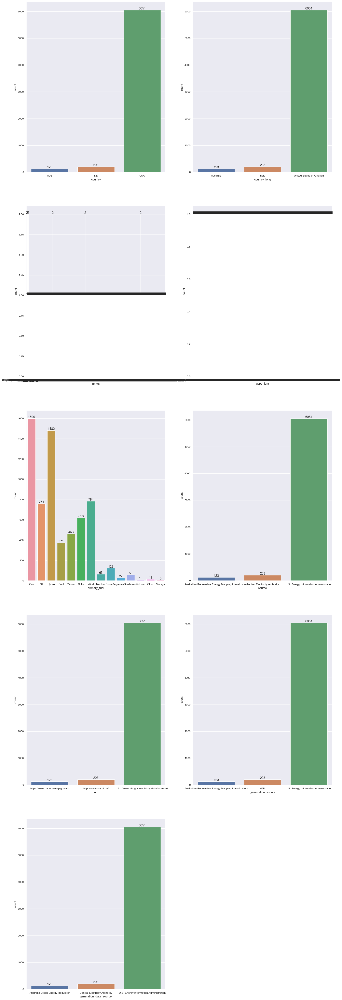

In [402]:
plt.figure(figsize =(20, 65))
plotnumber =1

for i in cat_col:
    if plotnumber <=10:
        plt.subplot(5, 2, plotnumber)
        ax =sns.countplot(x =i, data =df)
        ax.bar_label(ax.containers[0], fontsize =12)
        plt.xlabel(i)
    plotnumber+=1
plt.show()

## Checking data distribution for numerical columns

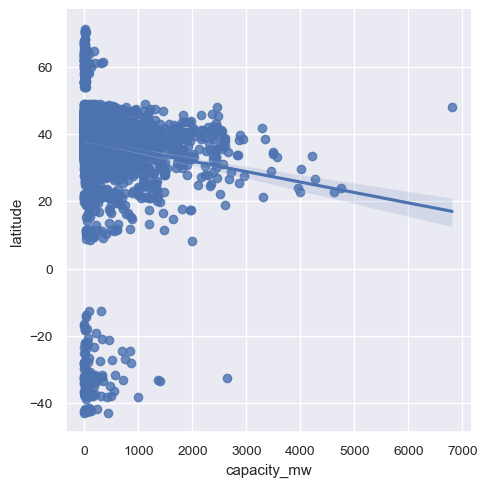

In [403]:
sns.lmplot(x ='capacity_mw', y ='latitude', data =df, palette ='colorblind')
plt.show()

__Latitude is not correlated with the label.__

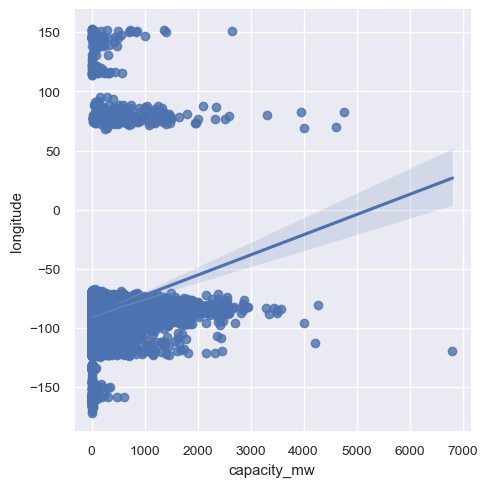

In [404]:
sns.lmplot(x ='capacity_mw', y ='longitude', data =df, palette ='colorblind')
plt.show()

__Longitude is not correlated with the label.__

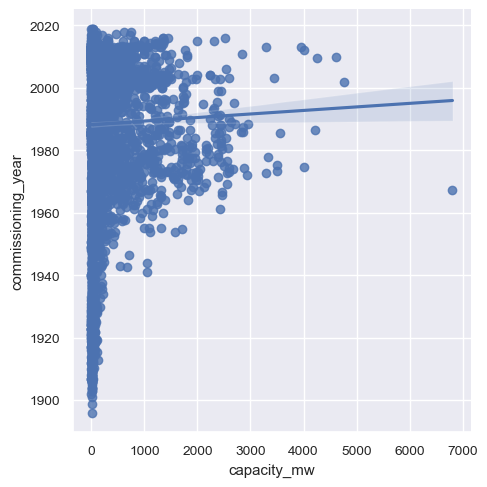

In [405]:
sns.lmplot(x ='capacity_mw', y ='commissioning_year', data =df, palette ='colorblind')
plt.show()

__commissioning_year is not correlated with the label.__

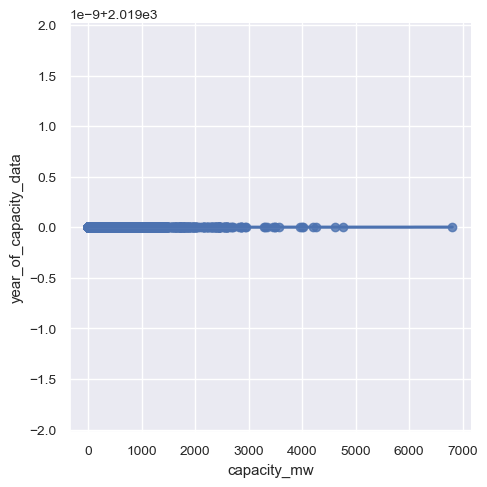

In [406]:
sns.lmplot(x ='capacity_mw', y ='year_of_capacity_data', data =df, palette ='colorblind')
plt.show()

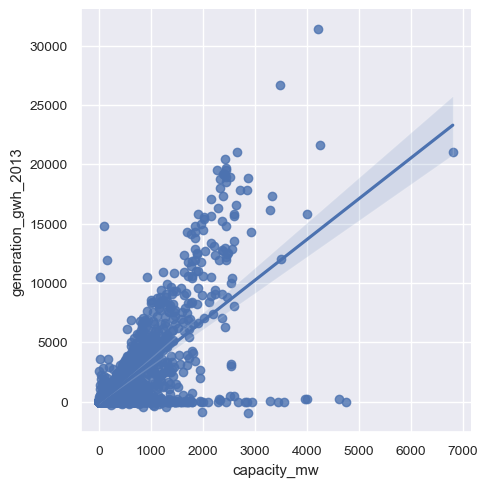

In [407]:
sns.lmplot(x ='capacity_mw', y ='generation_gwh_2013', data =df, palette ='colorblind')
plt.show()

__generation_gwh_2013 is highly correlated with the label.__

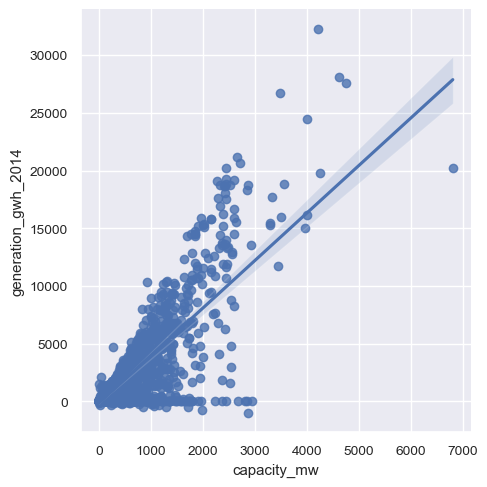

In [408]:
sns.lmplot(x ='capacity_mw', y ='generation_gwh_2014', data =df, palette ='colorblind')
plt.show()

__generation_gwh_2014 is highly correlated with the label.__

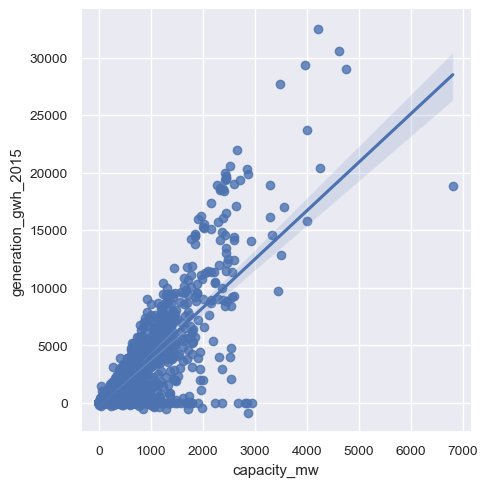

In [409]:
sns.lmplot(x ='capacity_mw', y ='generation_gwh_2015', data =df, palette ='colorblind')
plt.show()

__generation_gwh_2015 is highly correlated with the label.__

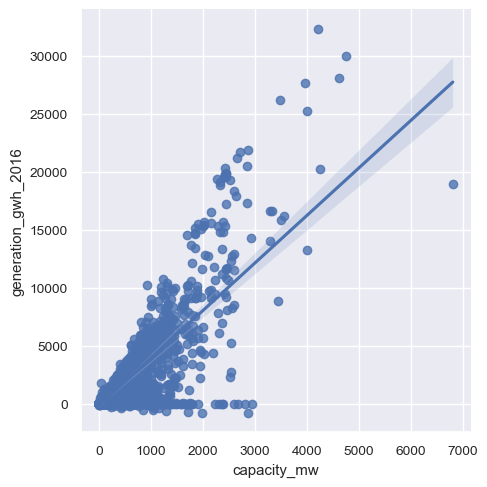

In [410]:
sns.lmplot(x ='capacity_mw', y ='generation_gwh_2016', data =df, palette ='colorblind')
plt.show()

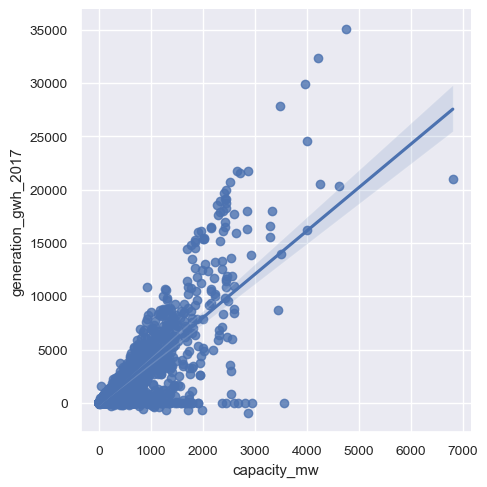

In [411]:
sns.lmplot(x ='capacity_mw', y ='generation_gwh_2017', data =df, palette ='colorblind')
plt.show()

__generation_gwh_2017 is highly correlated with the label.__

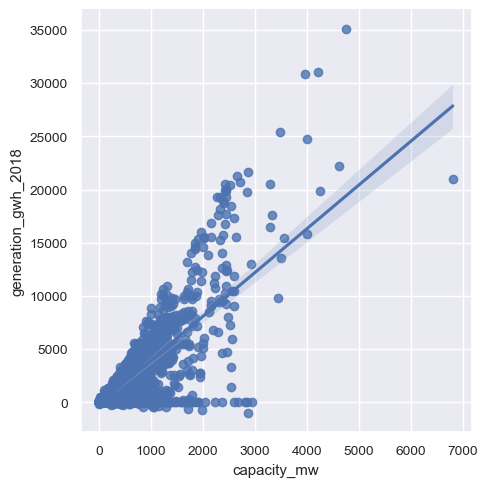

In [412]:
sns.lmplot(x ='capacity_mw', y ='generation_gwh_2018', data =df, palette ='colorblind')
plt.show()

__generation_gwh_2018 is highly correlated with the label.__

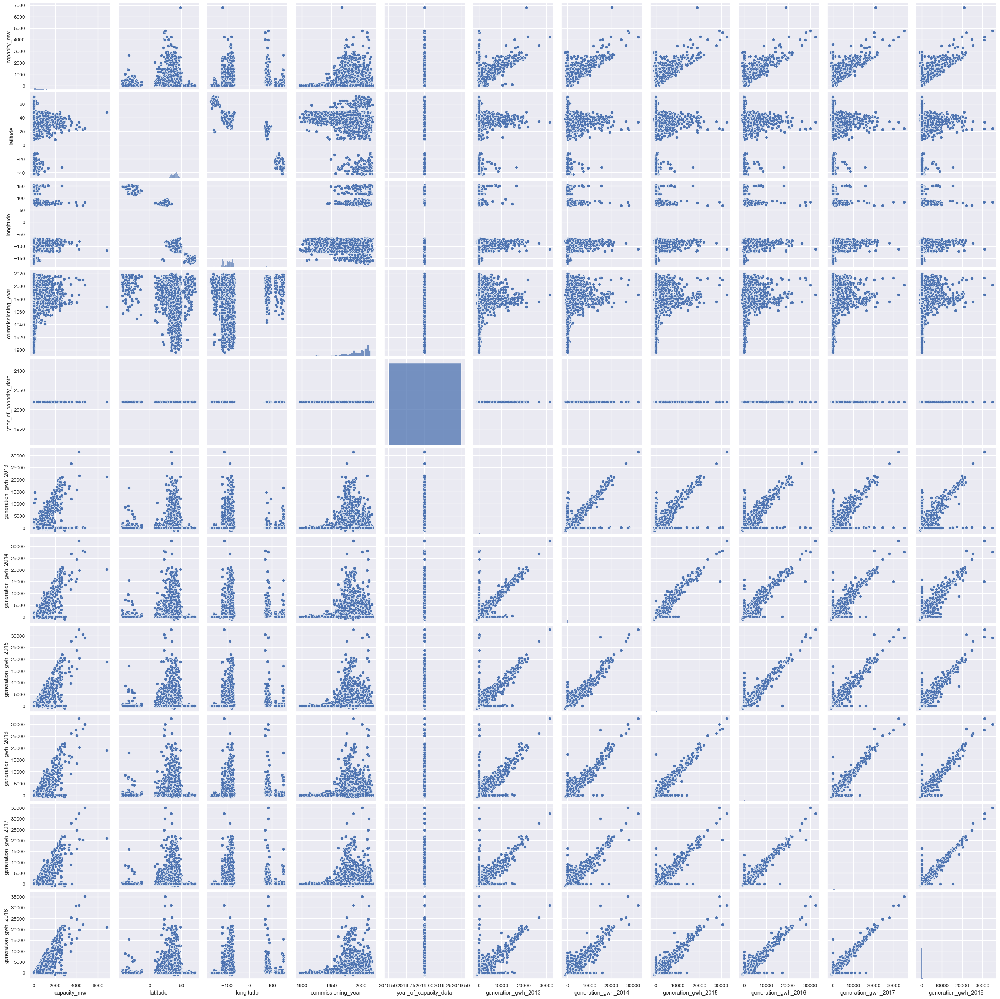

In [413]:
# Plotting pair plot
sns.pairplot(data =df, palette ='Dark2')
plt.show()

In [414]:
df_num =df[['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018']]

In [415]:
df_num.reset_index(inplace =True, drop =True)

In [416]:
#df_num.drop(columns =['index'], inplace =True)

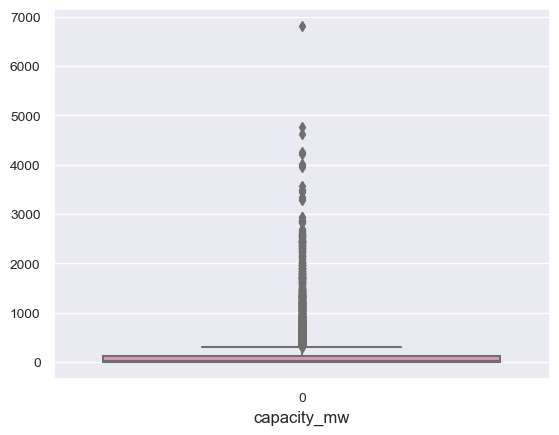

In [417]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['capacity_mw'], palette ="Set2_r")
plt.xlabel('capacity_mw', fontsize =12)
plt.show()

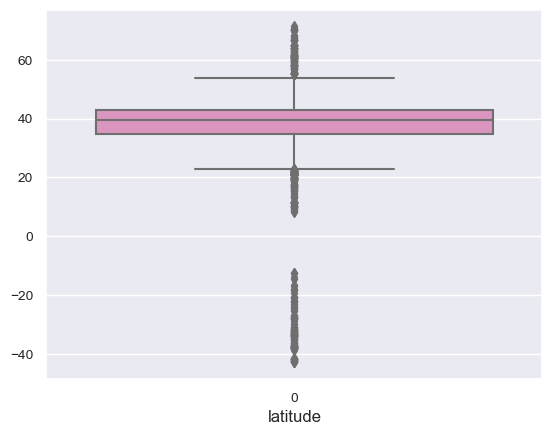

In [418]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['latitude'], palette ="Set2_r")
plt.xlabel('latitude', fontsize =12)
plt.show()

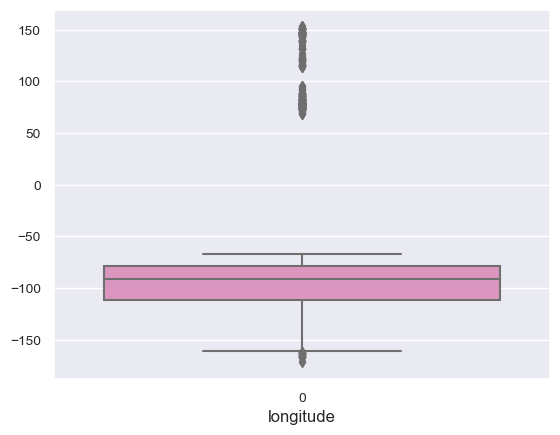

In [419]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['longitude'], palette ="Set2_r")
plt.xlabel('longitude', fontsize =12)
plt.show()

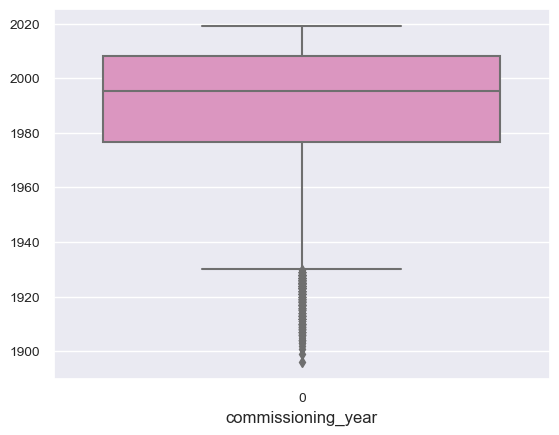

In [420]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['commissioning_year'], palette ="Set2_r")
plt.xlabel('commissioning_year', fontsize =12)
plt.show()

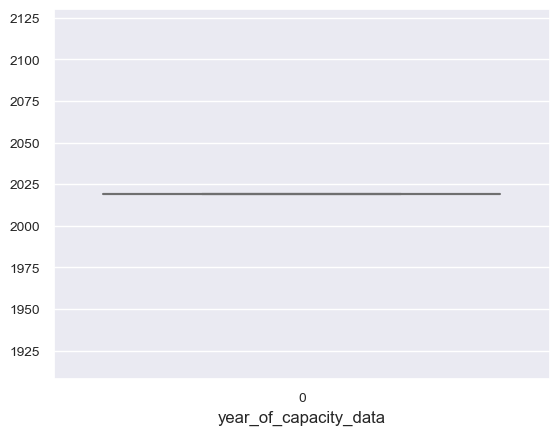

In [421]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['year_of_capacity_data'], palette ="Set2_r")
plt.xlabel('year_of_capacity_data', fontsize =12)
plt.show()

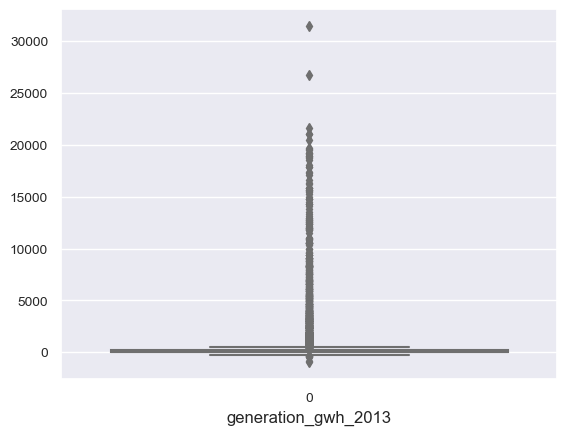

In [422]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['generation_gwh_2013'], palette ="Set2_r")
plt.xlabel('generation_gwh_2013', fontsize =12)
plt.show()

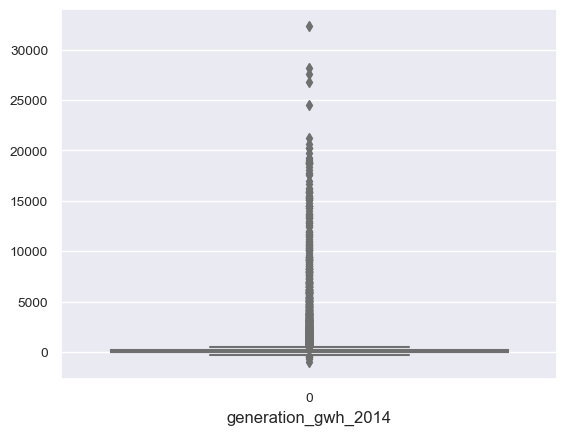

In [423]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['generation_gwh_2014'], palette ="Set2_r")
plt.xlabel('generation_gwh_2014', fontsize =12)
plt.show()

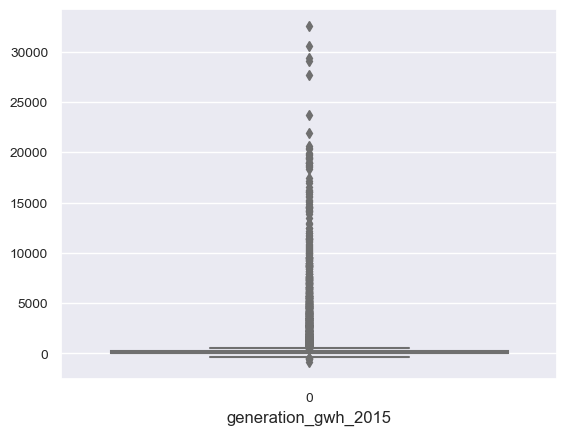

In [424]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['generation_gwh_2015'], palette ="Set2_r")
plt.xlabel('generation_gwh_2015', fontsize =12)
plt.show()

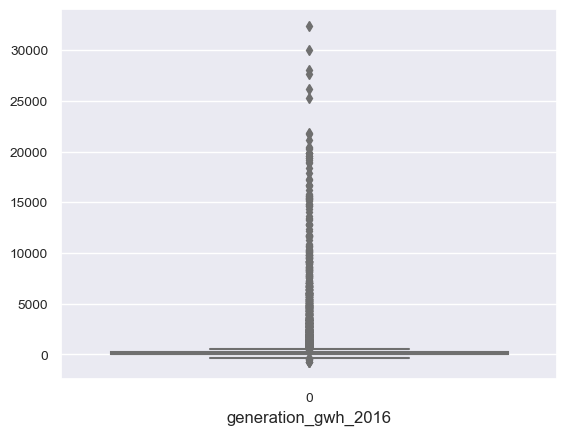

In [425]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['generation_gwh_2016'], palette ="Set2_r")
plt.xlabel('generation_gwh_2016', fontsize =12)
plt.show()

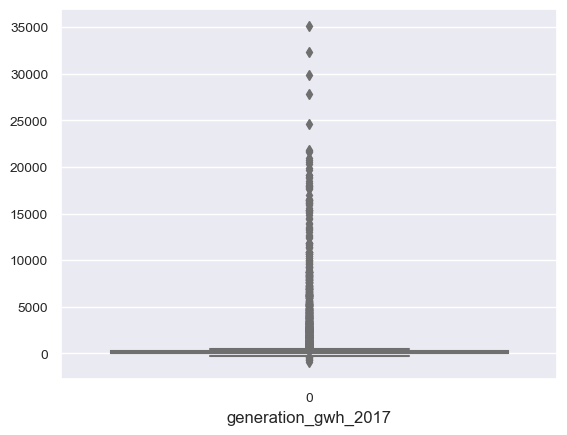

In [426]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['generation_gwh_2017'], palette ="Set2_r")
plt.xlabel('generation_gwh_2017', fontsize =12)
plt.show()

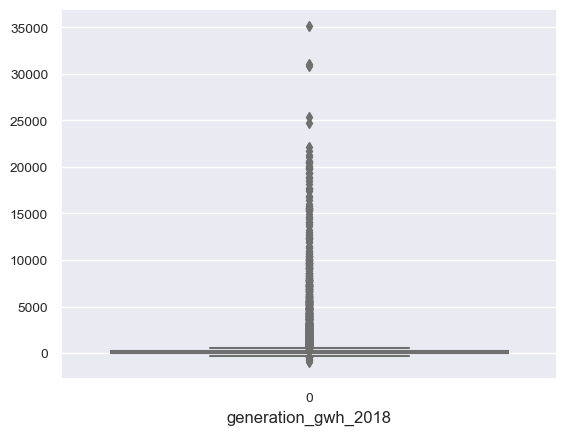

In [427]:
# Plottting boxplot to check outliers
sns.boxplot(df_num['generation_gwh_2018'], palette ="Set2_r")
plt.xlabel('generation_gwh_2018', fontsize =12)
plt.show()

In [428]:
# Removing outliers using zscore
df_num =df[['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018']]
print(df.shape)
z =np.abs(zscore(df_num))
df_num =df_num[(z <3).all(axis =1)]
print(df_num.shape)

(6377, 20)
(5773, 10)


__We will not delete any outliers as all the zscore value is less than 3.__

In [429]:
#Checking skewness
df[num_col].skew()

capacity_mw              4.272393
latitude                -3.979157
longitude                3.188194
commissioning_year      -1.335855
year_of_capacity_data    0.000000
generation_gwh_2013      6.205585
generation_gwh_2014      6.064944
generation_gwh_2015      6.219142
generation_gwh_2016      6.335838
generation_gwh_2017      6.480038
generation_gwh_2018      6.434998
dtype: float64

In [430]:
# Removing skewness
df['capacity_mw'] =np.cbrt(df['capacity_mw'])
df['latitude'] =np.cbrt(df['latitude'])
df['longitude'] =np.cbrt(df['longitude'])
df['commissioning_year'] =np.cbrt(df['commissioning_year'])
df['generation_gwh_2013'] =np.cbrt(df['generation_gwh_2013'])
df['generation_gwh_2014'] =np.cbrt(df['generation_gwh_2014'])
df['generation_gwh_2015'] =np.cbrt(df['generation_gwh_2015'])
df['generation_gwh_2016'] =np.cbrt(df['generation_gwh_2016'])
df['generation_gwh_2017'] =np.cbrt(df['generation_gwh_2017'])
df['generation_gwh_2018'] =np.cbrt(df['generation_gwh_2018'])

In [431]:
#Again Checking skewness
df[num_col].skew()

capacity_mw              1.408359
latitude                -6.488498
longitude                3.961024
commissioning_year      -1.354895
year_of_capacity_data    0.000000
generation_gwh_2013      1.998740
generation_gwh_2014      1.920962
generation_gwh_2015      1.882291
generation_gwh_2016      1.897798
generation_gwh_2017      1.919720
generation_gwh_2018      1.907425
dtype: float64

In [432]:
df.isnull().sum()

country                   0
country_long              0
name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
commissioning_year        0
source                    0
url                       0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2013       0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_gwh_2018       0
generation_data_source    0
dtype: int64

In [433]:
# Again Removing skewness
df['capacity_mw'] =np.cbrt(df['capacity_mw'])
df['latitude'] =np.cbrt(df['latitude'])
df['longitude'] =np.cbrt(df['longitude'])
df['commissioning_year'] =np.cbrt(df['commissioning_year'])
df['generation_gwh_2013'] =np.cbrt(df['generation_gwh_2013'])
df['generation_gwh_2014'] =np.cbrt(df['generation_gwh_2014'])
df['generation_gwh_2015'] =np.cbrt(df['generation_gwh_2015'])
df['generation_gwh_2016'] =np.cbrt(df['generation_gwh_2016'])
df['generation_gwh_2017'] =np.cbrt(df['generation_gwh_2017'])
df['generation_gwh_2018'] =np.cbrt(df['generation_gwh_2018'])

In [434]:
#Again Checking skewness
df[num_col].skew()

capacity_mw              0.644997
latitude                -6.929949
longitude                4.064065
commissioning_year      -1.361269
year_of_capacity_data    0.000000
generation_gwh_2013     -0.795656
generation_gwh_2014     -0.850050
generation_gwh_2015     -0.850983
generation_gwh_2016     -0.855886
generation_gwh_2017     -0.834319
generation_gwh_2018     -0.809649
dtype: float64

In [435]:
df.isnull().sum()

country                   0
country_long              0
name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
commissioning_year        0
source                    0
url                       0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2013       0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_gwh_2018       0
generation_data_source    0
dtype: int64

In [436]:
# Encoding numerical columns using Ordinal Encoder
# Encoding categorical columns using ordinal encoder
from sklearn.preprocessing import OrdinalEncoder
OE =OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i] =OE.fit_transform(df[i].values.reshape(-1, 1))
        
df

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,source,url,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_data_source
0,0.0,0.0,219.0,85.0,1.562778,-1.480672,1.745966,3.0,2.327435,0.0,2.0,0.0,2019.0,1.806406,1.837062,1.761859,1.756222,1.588869,1.667116,0.0
1,0.0,0.0,246.0,105.0,0.975511,-1.364939,1.706978,7.0,2.328722,0.0,2.0,0.0,2019.0,1.064247,1.066884,1.065739,1.080575,1.070565,1.077774,0.0
2,0.0,0.0,352.0,20.0,1.656672,-1.497379,1.741798,3.0,2.328337,0.0,2.0,0.0,2019.0,1.721020,1.751195,1.744738,1.799173,1.767694,1.855403,0.0
3,0.0,0.0,360.0,33.0,1.129831,-1.496129,1.736868,3.0,2.325233,0.0,2.0,0.0,2019.0,1.172698,1.173275,1.197910,1.238007,1.234586,1.239455,0.0
4,0.0,0.0,361.0,4.0,1.328041,-1.491535,1.741661,5.0,2.325493,0.0,2.0,0.0,2019.0,1.311361,1.437690,1.498425,1.534732,1.131426,1.133151,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6372,2.0,2.0,6364.0,4111.0,2.034311,1.516724,-1.644357,3.0,2.327220,2.0,1.0,1.0,2019.0,0.000000,1.586451,1.720988,1.964356,0.000000,2.004486,2.0
6373,2.0,2.0,6365.0,4916.0,1.241366,1.516735,-1.644338,12.0,2.327306,2.0,1.0,1.0,2019.0,1.521095,1.541457,1.532776,1.516734,1.500976,1.461889,2.0
6374,2.0,2.0,6366.0,1008.0,1.378716,1.499292,-1.639747,3.0,2.322883,2.0,1.0,1.0,2019.0,0.837636,0.753181,1.006284,0.734212,0.627110,-0.747657,2.0
6375,2.0,2.0,6367.0,5482.0,1.145653,1.518341,-1.620281,13.0,2.328465,2.0,1.0,1.0,2019.0,1.155457,1.105198,1.106631,1.058635,1.023590,1.113427,2.0


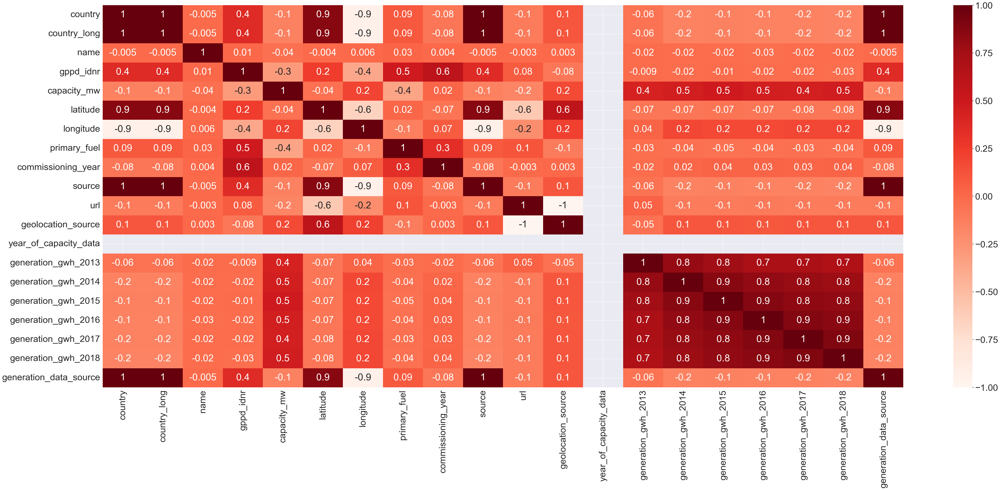

In [437]:
# Plotting heatmap
plt.figure(figsize=(65,25))
sns.set(font_scale =3)
sns.heatmap(df.corr(), annot=True, fmt ='.1g', cmap="Reds", annot_kws ={"size" :35})
plt.show()

__Finding as per above heatmap.__
1. Negative Multicollenearity between country and longitude
2. Multicollenearity between latitude and source
3. Multicollenearity between source and generation_data_source, country, country_long
4. Multicollenearity between (generation_gwh_2015 vs generation_gwh_2014), (generation_gwh_2016 vs generation_gwh_2015), 
    (generation_gwh_2017 vs generation_gwh_2016), (generation_gwh_2018 vs generation_gwh_2017)

In [438]:
# Deleting longitude, latitude, generation_gwh_2014
df.drop(columns =['longitude', 'latitude', 'generation_gwh_2014'], inplace =True)

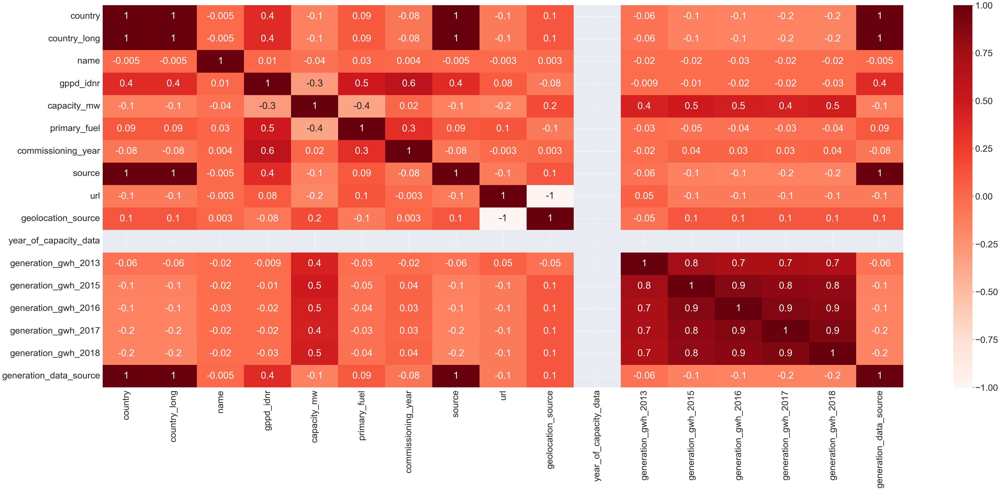

In [439]:
# Again checking heatmap
plt.figure(figsize=(65,25))
sns.set(font_scale =3)
sns.heatmap(df.corr(), annot=True, fmt ='.1g', cmap="Reds", annot_kws ={"size" :35})
plt.show()

In [440]:
# Deleting country_long, source, generation_gwh_2016
df.drop(columns =['country_long', 'source', 'generation_gwh_2016'], inplace =True)

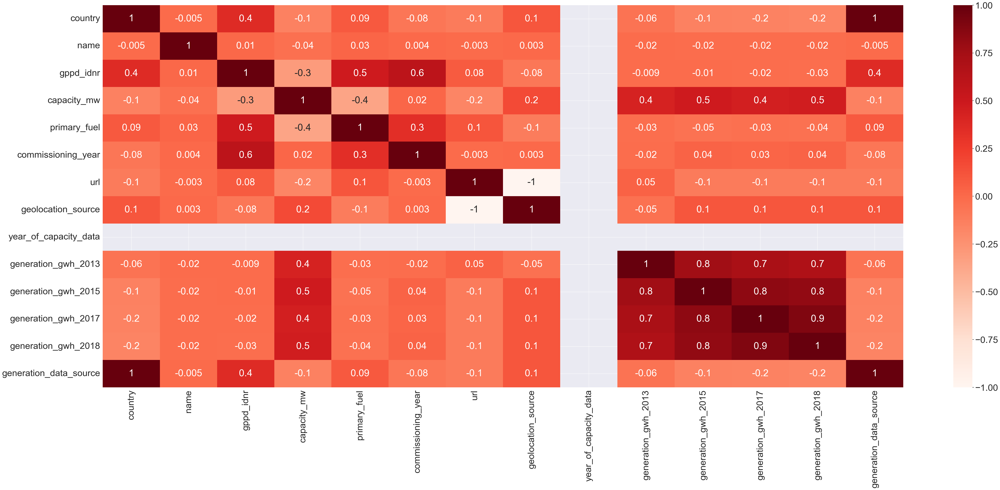

In [441]:
# Again checking heatmap
plt.figure(figsize=(65,25))
sns.set(font_scale =3)
sns.heatmap(df.corr(), annot=True, fmt ='.1g', cmap="Reds", annot_kws ={"size" :35})
plt.show()

In [442]:
# Deleting generation_gwh_2017
df.drop(columns =['generation_gwh_2017'], inplace =True)

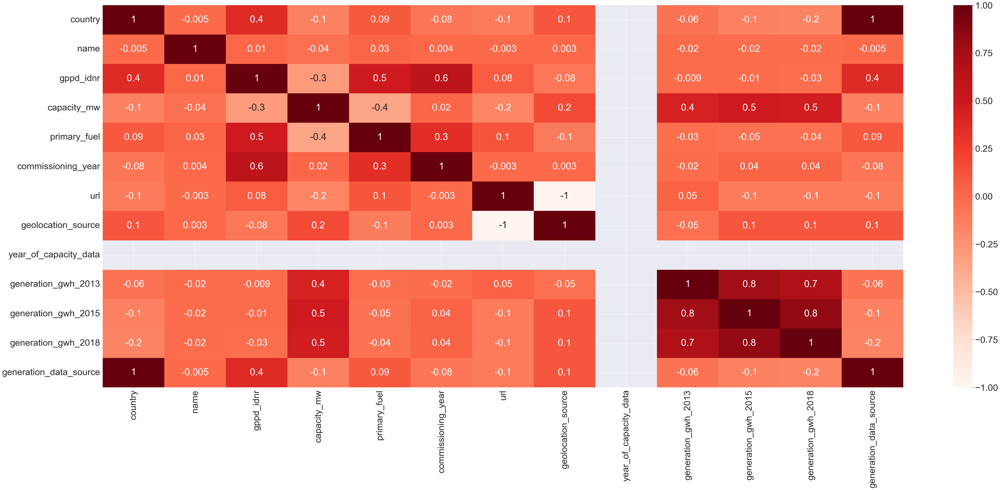

In [443]:
# Again checking heatmap
plt.figure(figsize=(65,25))
sns.set(font_scale =3)
sns.heatmap(df.corr(), annot=True, fmt ='.1g', cmap="Reds", annot_kws ={"size" :35})
plt.show()

__generation_gwh_2013, generation_gwh_2015 and generation_gwh_2018 have also multicollinearity between them. Lets check.__

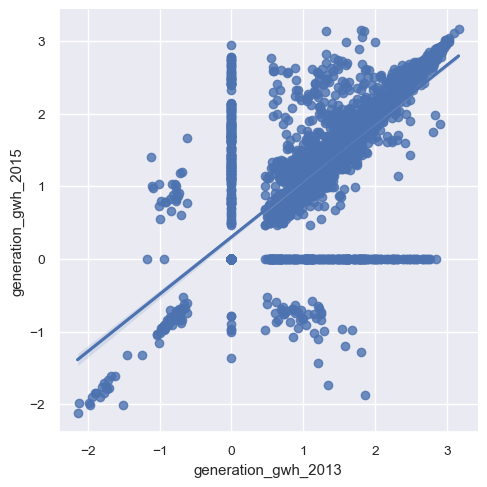

In [444]:
# Plotting lmplot
sns.set(font_scale =.9)
sns.lmplot(x ='generation_gwh_2013', y ='generation_gwh_2015', data =df)
plt.show()

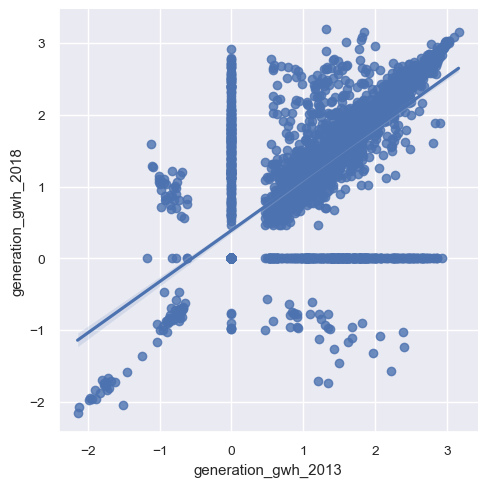

In [445]:
# Plotting lmplot
sns.set(font_scale =.9)
sns.lmplot(x ='generation_gwh_2013', y ='generation_gwh_2018', data =df)
plt.show()

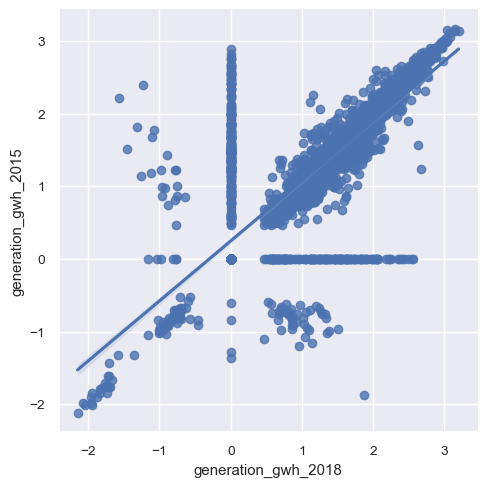

In [446]:
# Plotting lmplot
sns.set(font_scale =.9)
sns.lmplot(x ='generation_gwh_2018', y ='generation_gwh_2015', data =df)
plt.show()

__We cannot confirm multicollinearity by plotting lmplot.__

## Data standardization using StandardScaler

In [447]:
# Shuffling dataset
df =df.sample(frac =1)

In [448]:
# Seperating features and label
x =df.drop(columns =['capacity_mw'])
y =df[['capacity_mw']]

In [449]:
scaler =StandardScaler()
x =pd.DataFrame(scaler.fit_transform(x), columns =x.columns)
x

,country,name,gppd_idnr,primary_fuel,commissioning_year,url,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2015,generation_gwh_2018,generation_data_source
0,0.218301,-0.341726,-0.470970,0.157940,-0.070475,0.055570,-0.055570,0.0,-0.568415,-0.944871,-0.843309,0.218301
1,0.218301,-0.238918,-1.033744,-0.876927,-0.323550,0.055570,-0.055570,0.0,-1.881255,0.633385,0.462695,0.218301
2,0.218301,1.596392,1.489504,0.934091,0.971104,0.055570,-0.055570,0.0,-0.399339,-0.330063,-0.324237,0.218301
3,0.218301,0.047203,1.073942,1.710241,0.931913,0.055570,-0.055570,0.0,1.054228,0.958993,1.014913,0.218301
4,0.218301,1.231941,0.343314,0.157940,0.223490,0.055570,-0.055570,0.0,-0.910616,-0.899867,-0.827104,0.218301
...,...,...,...,...,...,...,...,...,...,...,...,...
6372,0.218301,-0.675172,1.135869,1.710241,0.814235,0.055570,-0.055570,0.0,-0.065167,-0.081069,-0.071755,0.218301
6373,-2.882151,-0.180715,-1.629654,-1.394361,0.460260,-4.374075,4.374075,0.0,-1.881255,1.779463,1.758885,-2.882151
6374,0.218301,-1.707058,-0.794728,-0.876927,0.614567,0.055570,-0.055570,0.0,-0.122664,-0.148729,0.185520,0.218301
6375,0.218301,0.776649,0.730085,-0.618210,0.774974,0.055570,-0.055570,0.0,0.218669,0.336158,0.375783,0.218301


In [450]:
# Checking VIF score
vif =pd.DataFrame()
vif['VIF Values'] =[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] =x.columns
vif

,VIF Values,Features
0,inf,country
1,1.001743e+00,name
2,2.499689e+00,gppd_idnr
3,1.330619e+00,primary_fuel
4,1.892427e+00,commissioning_year
5,1.233831e+06,url
6,1.233831e+06,geolocation_source
7,NaN,year_of_capacity_data
8,2.574348e+00,generation_gwh_2013
9,4.177359e+00,generation_gwh_2015


In [451]:
# We will delete country, url, geolocation_source and generation_data_source as they have infinity vif score
df.drop(columns =['country', 'url', 'geolocation_source', 'generation_data_source'], inplace =True)

# EDA part completed

## Model building

### Finding best random state

In [452]:
maxrs =0
maxacc =0

for i in range (1, 200):
    x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =i)
    LR =LinearRegression()
    LR.fit(x_train, y_train)
    pred =LR.predict(x_test)
    acc =r2_score(y_test, pred)
    
    if acc > maxacc:
        maxacc =acc
        maxrs =i
        
print("Maximum accuracy is :", maxacc, "at random state :", maxrs)

Maximum accuracy is : 0.5274006240249248 at random state : 184


In [453]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =maxrs)

In [454]:
# Initiailizing Models
RFR =RandomForestRegressor()
ETR =ExtraTreesRegressor()
LR =LinearRegression()
svr =SVR()
GBR =GradientBoostingRegressor()
ADB =AdaBoostRegressor()
BR =BaggingRegressor()
DTR =DecisionTreeRegressor()
lasso =Lasso()
ridge =Ridge()

In [456]:
# Building model

models ={'RandomForestRegressor' :RFR,
        'ExtraTreesRegressor' :ETR,
        'LinearRegression' : LR,
        'SVR' :svr,
        'GradientBoostingRegressor': GBR,
        'AdaBoostRegressor': ADB,
        'BaggingRegressor': BR,
        'DecisionTreeRegressor': DTR,
        'Lasso': lasso,
        'Ridge': ridge}

for name, model in models.items():
    model.fit(x_train, y_train)
    pred_train =model.predict(x_train)
    pred_test =model.predict(x_test)
    acc =r2_score(y_test, pred)
    
    print("Model Name :", name)
    print("*"*20)
    print("R2 score on training data :", (r2_score(y_train, pred_train))*100)
    print("R2 score on Test data :", (r2_score(y_test, pred_test))*100)
    print("Mean absolute error :", mean_absolute_error(y_test, pred_test))
    print("Mean squared error :", mean_squared_error(y_test, pred_test))
    print("Root mean squared error :", np.sqrt(mean_squared_error(y_test, pred_test)))
    print('\n')
    
    print("Cross Validation :")
    print("*"*20)
    score =cross_val_score(model, x, y, cv=5)
    print(score)
    print(score.mean())
    print("Difference between R2 Score and Cross Val Score is : ", (r2_score(y_test, pred_test) - score.mean())*100)
    print("="*80)
    print('\n')



Model Name : RandomForestRegressor
********************
R2 score on training data : 98.39832653290728
R2 score on Test data : 90.36908581411411
Mean absolute error : 0.07347487463027917
Mean squared error : 0.012797031112160413
Root mean squared error : 0.11312396347441338


Cross Validation :
********************
[0.88806905 0.90175677 0.90241093 0.88655225 0.89468056]
0.8946939122345186
Difference between R2 Score and Cross Val Score is :  0.8996945906622589


Model Name : ExtraTreesRegressor
********************
R2 score on training data : 100.0
R2 score on Test data : 90.37350348322005
Mean absolute error : 0.0719338030656603
Mean squared error : 0.012791161155487486
Root mean squared error : 0.11309801570092858


Cross Validation :
********************
[0.88943026 0.90455051 0.90053767 0.88966199 0.90334049]
0.8975041850521457
Difference between R2 Score and Cross Val Score is :  0.6230849780054837


Model Name : LinearRegression
********************
R2 score on training data : 43

__Based on performance of all the models ExtraTreesRegressor is our best model with the accuracy of 90.37%.__

## Hyperparameter tunning

In [457]:
parameter ={'n_estimators' :[10, 20],
           'criterion': ['squared_error', 'friedman_mse'],
           'max_depth': [2, 8, 16],
           'min_samples_split' :[2, 4, 6],
           'min_samples_leaf' :[1, 2],
           'max_features' :['sqrt', 'log2']
           }

In [458]:
GCV =GridSearchCV(ExtraTreesRegressor(), parameter, cv =5)
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse'],
                         'max_depth': [2, 8, 16],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [10, 20]})

In [459]:
GCV.best_params_

{'criterion': 'squared_error',
 'max_depth': 16,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 20}

In [467]:
ETR =ExtraTreesRegressor(criterion ='squared_error',
                                max_depth =16,
                                max_features ='log2',
                                min_samples_leaf =1,
                                min_samples_split =4,
                                n_estimators =100)
ETR.fit(x_train, y_train)
pred =ETR.predict(x_test)
accuracy =r2_score(y_test, pred)
print("Accuracy is :",accuracy*100)

Accuracy is : 87.34518148071344


__Accuracy does not increase after hyperparamater tunning. We will go with default paramaters

In [468]:
# Our Final model is ExtraTreeRegressor()

Final_model =ExtraTreesRegressor()
Final_model.fit(x_train, y_train)
pred =Final_model.predict(x_test)
acc =r2_score(y_test, pred)
print("Accuracy is :", acc*100)

Accuracy is : 90.34446155402928


In [470]:
# Saving Model
pickle.dump(Final_model, open('Avacado_price.pkl', 'wb'))

In [471]:
# Loading the Model
loaded_model =pickle.load(open('Avacado_price.pkl', 'rb'))
pred =loaded_model.predict(x_test)
result =loaded_model.score(x_test, y_test)
print(result*100)

90.34446155402928


In [472]:
#Comparing Actual Vs Predicted
act =np.array(y_test)
df1 =pd.DataFrame()
df1['Predicted'] =pred
df1['Actual'] =act
df1

,Predicted,Actual
0,1.403452,1.181896
1,1.422892,1.305300
2,1.300821,1.426115
3,1.679509,1.668101
4,1.480572,1.190402
...,...,...
1909,1.430359,1.459233
1910,2.222644,2.172937
1911,1.602086,1.650712
1912,1.530658,1.575474


# Predicting Primary Fuel (Classification Problem)

In [85]:
# Import necessary Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import pickle

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import Australia dataset
AUS =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Global%20Power%20Plant%20Database/database_AUS.csv')
AUS.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,AUS0000433,0.11,-34.9387,138.5377,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,AUS0000432,1.00,-34.9453,138.5882,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,AUS0000065,21.60,-35.0641,117.7977,Wind,NaN,NaN,...,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,92.682222,NaN,Australia Clean Energy Regulator,NaN
3,AUS,Australia,Alice Springs Airport,AUS0000469,0.24,-23.7966,133.8971,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,AUS0000231,4.00,-34.5509,138.7659,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,AUS,Australia,Angaston,AUS0000232,50.00,-34.5034,139.0246,Oil,NaN,NaN,...,2019.0,NaN,NaN,1.653056,5.300833,7.649722,2.222222,NaN,Australia Clean Energy Regulator,NaN
6,AUS,Australia,Anglesea,AUS0000114,165.00,-38.3861,144.1828,Coal,NaN,NaN,...,2019.0,1095.676944,1239.962778,1260.261111,167.880000,NaN,NaN,NaN,Australia Clean Energy Regulator,NaN
7,AUS,Australia,Angurugu,AUS0000615,3.60,-13.8584,136.4209,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,AUS,Australia,Appin (Mine),AUS0000264,55.60,-34.2082,150.7722,Gas,NaN,NaN,...,2019.0,204.804444,238.294444,163.583611,158.933056,64.534722,99.470000,NaN,Australia Clean Energy Regulator,NaN
9,AUS,Australia,Ararat Wind Farm,AUS0000611,240.00,-37.2385,143.0794,Wind,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Importing India dataset
IND =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Global%20Power%20Plant%20Database/database_IND.csv')
IND.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,2.41461,617.789264,843.7470,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.3700,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,1.52800,1153.421000,1208.8520,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
6,IND,India,ALIYAR,IND0000004,60.0,10.4547,77.0078,Hydro,NaN,NaN,...,2019.0,5.03600,157.558250,152.1952,61.421350,89.629600,48.327150,NaN,Central Electricity Authority,NaN
7,IND,India,ALLAIN DUHANGAN,IND0000005,192.0,32.2258,77.2070,Hydro,NaN,NaN,...,2019.0,0.21500,674.391100,721.3352,675.724400,679.594950,579.318850,NaN,Central Electricity Authority,NaN
8,IND,India,ALMATTI DAM,IND0000006,290.0,16.3300,75.8863,Hydro,NaN,NaN,...,2019.0,NaN,480.594950,144.4342,402.029750,439.372100,406.377900,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.0460,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN


In [4]:
#importing USA dataset
USA =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Global%20Power%20Plant%20Database/database_USA.csv')
USA.head(10)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,USA,United States of America,10 Briggs Solar NG LLC (East),USA0062781,0.0,41.6327,-71.4963,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USA,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,2.467,U.S. Energy Information Administration,NaN
2,USA,United States of America,1001 Ebenezer Church Solar,USA0063444,0.0,36.2838,-80.8434,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USA,United States of America,1008 Matthews Solar,USA0063447,0.0,36.2167,-80.5525,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USA,United States of America,1009 Yadkin Solar,USA0063445,0.0,36.1475,-80.6561,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,USA,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,1.332,U.S. Energy Information Administration,NaN
6,USA,United States of America,1045 Tomlin Mill Solar,USA0063448,0.0,35.9162,-80.8355,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,USA,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,1.417,U.S. Energy Information Administration,NaN
8,USA,United States of America,1073 Onslow Solar,USA0063446,0.0,34.7736,-77.1858,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,USA,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,NaN,NaN,...,2019.0,2.41461,2.35,2.43,2.492,2.276,2.207,2.349,U.S. Energy Information Administration,NaN


In [5]:
AUS.shape

(512, 27)

In [6]:
IND.shape

(907, 27)

In [7]:
USA.shape

(11879, 27)

In [8]:
df1 =pd.concat([AUS, IND, USA], axis =0)

In [9]:
df1

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,AUS0000433,0.11,-34.9387,138.5377,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,AUS0000432,1.00,-34.9453,138.5882,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,AUS0000065,21.60,-35.0641,117.7977,Wind,NaN,NaN,...,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,92.682222,NaN,Australia Clean Energy Regulator,NaN
3,AUS,Australia,Alice Springs Airport,AUS0000469,0.24,-23.7966,133.8971,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,AUS0000231,4.00,-34.5509,138.7659,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11874,USA,United States of America,Zotos International WPGF,USA0057648,3.40,42.8869,-76.9683,Wind,NaN,NaN,...,2019.0,3.671000,2.460150,2.489000,1.670000,1.233490,2.630000,1.211,U.S. Energy Information Administration,NaN
11875,USA,United States of America,Zumbro Community Solar Garden,USA0061574,1.00,44.3195,-92.6703,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,1.161000,1.589,U.S. Energy Information Administration,NaN
11876,USA,United States of America,Zumbro Solar Garden,USA0063426,0.00,44.0460,-92.7600,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11877,USA,United States of America,Zuni,USA0000478,0.00,39.7373,-105.0170,NaN,NaN,NaN,...,2019.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,U.S. Energy Information Administration,NaN


In [10]:
# Checking Duplicate Records
print("No. of duplicate Records :", df1.duplicated().sum())

No. of duplicate Records : 0


In [11]:
df1.describe()

,capacity_mw,latitude,longitude,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,estimated_generation_gwh
count,13292.000000,13220.000000,13220.000000,10654.000000,0.0,12860.0,7170.000000,7534.000000,7993.000000,8701.000000,9292.000000,9858.000000,0.0
mean,117.738717,35.053213,-73.794217,1998.184904,NaN,2019.0,563.383222,635.739731,616.801877,561.784508,532.472482,513.679016,NaN
std,347.169038,15.444195,62.868834,24.017781,NaN,0.0,2030.523760,2193.172655,2148.167470,2050.411295,2001.411908,1963.485305,NaN
min,0.000000,-42.888300,-171.712400,1896.000000,NaN,2019.0,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000,NaN
25%,1.500000,33.901700,-104.659875,1988.000000,NaN,2019.0,1.653075,2.018000,2.140000,2.108000,2.063750,2.141250,NaN
50%,5.500000,38.389750,-87.346000,2008.000000,NaN,2019.0,21.384500,22.241000,19.504000,15.410278,13.433861,12.308500,NaN
75%,52.725000,42.175125,-75.475925,2015.000000,NaN,2019.0,185.326498,217.069500,200.279000,173.348004,157.889688,149.141249,NaN
max,6809.000000,425.246100,153.434100,2020.000000,NaN,2019.0,31431.080000,32320.917000,32525.595000,32377.477000,35116.000000,35136.000000,NaN


In [12]:
df1.isnull().sum()

country                         0
country_long                    0
name                            0
gppd_idnr                       0
capacity_mw                     6
latitude                       78
longitude                      78
primary_fuel                 2004
other_fuel1                 11670
other_fuel2                 13028
other_fuel3                 13206
commissioning_year           2644
owner                         593
source                          0
url                             0
geolocation_source             23
wepp_id                     13298
year_of_capacity_data         438
generation_gwh_2013          6128
generation_gwh_2014          5764
generation_gwh_2015          5305
generation_gwh_2016          4597
generation_gwh_2017          4006
generation_gwh_2018          3440
generation_gwh_2019          3520
generation_data_source       2463
estimated_generation_gwh    13298
dtype: int64

In [13]:
# Deleting wepp_id, as there is not data in the column
df1.drop(columns =['wepp_id'], inplace =True)

In [14]:
# There is some null values present in target variable. We will delete it.
df1.dropna(subset =['capacity_mw'], inplace =True)

In [15]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13292 entries, 0 to 11878
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   13292 non-null  object 
 1   country_long              13292 non-null  object 
 2   name                      13292 non-null  object 
 3   gppd_idnr                 13292 non-null  object 
 4   capacity_mw               13292 non-null  float64
 5   latitude                  13214 non-null  float64
 6   longitude                 13214 non-null  float64
 7   primary_fuel              11288 non-null  object 
 8   other_fuel1               1628 non-null   object 
 9   other_fuel2               270 non-null    object 
 10  other_fuel3               92 non-null     object 
 11  commissioning_year        10648 non-null  float64
 12  owner                     12701 non-null  object 
 13  source                    13292 non-null  object 
 14  url        

In [16]:
df1[df1['primary_fuel'].isnull()]

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,USA,United States of America,10 Briggs Solar NG LLC (East),USA0062781,0.0,41.6327,-71.4963,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,USA,United States of America,1001 Ebenezer Church Solar,USA0063444,0.0,36.2838,-80.8434,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USA,United States of America,1008 Matthews Solar,USA0063447,0.0,36.2167,-80.5525,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USA,United States of America,1009 Yadkin Solar,USA0063445,0.0,36.1475,-80.6561,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,USA,United States of America,1045 Tomlin Mill Solar,USA0063448,0.0,35.9162,-80.8355,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11852,USA,United States of America,Yorktown Battery Energy Storage Facility,USA0063325,0.0,34.0047,-118.0684,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11858,USA,United States of America,Yum Yum Solar LLC,USA0063026,0.0,35.2525,-89.2514,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11868,USA,United States of America,Zephyr Wind Project - 2.0,USA0062653,0.0,41.0931,-83.6378,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,U.S. Energy Information Administration,NaN
11876,USA,United States of America,Zumbro Solar Garden,USA0063426,0.0,44.0460,-92.7600,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# Checking count of each column
for i in df1:
    print(df1[i].value_counts())

country
USA    11879
IND      907
AUS      506
Name: count, dtype: int64
country_long
United States of America    11879
India                         907
Australia                     506
Name: count, dtype: int64
name
Richland                       3
Bear Creek Solar               2
Costa Sur                      2
Newport                        2
Scarlet Solar                  2
                              ..
E&B Resources                  1
E-Volve Energy Holdings LLC    1
E. Goenner Project CSG         1
E.B. Eddy Paper Inc            1
eBay - South Jordan            1
Name: count, Length: 13260, dtype: int64
gppd_idnr
AUS0000433    1
USA0062244    1
USA0061333    1
USA0062243    1
USA0062252    1
             ..
USA0000260    1
USA0006211    1
USA0007897    1
USA0000026    1
USA0059281    1
Name: count, Length: 13292, dtype: int64
capacity_mw
0.0      2030
5.0       552
1.0       534
2.0       479
1.5       267
         ... 
772.0       1
119.1       1
251.8       1
153.9       

In [18]:
# Deleting primary fuel with null value
df1.dropna(subset =['primary_fuel'], inplace =True)

In [19]:
df1.isnull().sum()

country                         0
country_long                    0
name                            0
gppd_idnr                       0
capacity_mw                     0
latitude                       50
longitude                      50
primary_fuel                    0
other_fuel1                  9660
other_fuel2                 11018
other_fuel3                 11196
commissioning_year            640
owner                         591
source                          0
url                             0
geolocation_source             23
year_of_capacity_data         438
generation_gwh_2013          4431
generation_gwh_2014          4031
generation_gwh_2015          3545
generation_gwh_2016          2791
generation_gwh_2017          2168
generation_gwh_2018          1578
generation_gwh_2019          1620
generation_data_source        791
estimated_generation_gwh    11288
dtype: int64

In [20]:
df1[df1['other_fuel1'].notnull()]

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.370000,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,1.528000,1153.421000,1208.852000,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.046000,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN
10,IND,India,AMARAVATI TPP,IND0000008,1350.0,21.0782,77.9009,Coal,Oil,NaN,...,2019.0,2.741000,1920.971000,5629.663000,1701.008000,4350.558000,3717.154000,NaN,Central Electricity Authority,NaN
12,IND,India,"ANAPARA ""C""",IND0000010,1200.0,24.2007,82.8000,Coal,Oil,NaN,...,2019.0,NaN,7744.000000,8076.810500,7902.021600,7940.740000,7873.973000,NaN,Central Electricity Authority,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11835,USA,United States of America,Yellowstone Energy LP,USA0050931,68.0,45.8117,-108.4278,Petcoke,Gas,NaN,...,2019.0,448.668001,404.659999,500.087004,452.014003,459.442997,442.909996,459.719002,U.S. Energy Information Administration,NaN
11846,USA,United States of America,York Energy Center,USA0055524,1449.4,39.7375,-76.3067,Gas,Oil,NaN,...,2019.0,0.000000,2537.263961,1976.570043,1552.401039,1590.270971,1838.909987,5340.573066,U.S. Energy Information Administration,NaN
11857,USA,United States of America,Yucca,USA0000120,425.0,32.7214,-114.7106,Gas,Oil,NaN,...,2019.0,315.526000,347.465998,330.414000,360.704000,312.684998,456.777005,414.041001,U.S. Energy Information Administration,NaN
11864,USA,United States of America,Zeeland,USA0001867,22.3,42.8067,-86.0558,Gas,Oil,NaN,...,2019.0,1.005480,-0.344000,-0.194000,0.050000,0.363000,0.257000,0.269,U.S. Energy Information Administration,NaN


In [21]:
# Checking Primary fuel vs other fuel1 data distribution
cross_tab =pd.crosstab(df1['primary_fuel'], df1['other_fuel1'], margins =True)
cross_tab

other_fuel1,Biomass,Coal,Cogeneration,Gas,Hydro,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
primary_fuel,,,,,,,,,,,,,
Biomass,0,11,0,39,0,24,0,0,1,0,31,0,106
Coal,0,0,1,58,0,276,2,11,1,0,18,0,367
Cogeneration,0,0,0,5,0,1,1,0,0,0,0,0,7
Gas,13,39,4,0,2,630,7,3,8,4,10,1,721
Geothermal,0,0,0,0,0,0,0,0,3,0,0,0,3
Hydro,0,0,0,0,0,3,0,0,0,0,0,0,3
Nuclear,0,0,0,0,1,4,0,0,0,0,0,0,5
Oil,0,0,0,150,17,0,5,0,3,4,4,5,188
Other,0,1,0,4,0,3,0,0,0,0,0,0,8


In [22]:
# Checking data distribution of country vs primary_fuel
cross_tab =pd.crosstab(df1['country'], df1['primary_fuel'], margins =True)
cross_tab

primary_fuel,Biomass,Coal,Cogeneration,Gas,Geothermal,Hydro,Nuclear,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,,,,,,
AUS,25,28,0,140,0,76,0,55,0,0,61,0,50,71,506
IND,50,258,0,69,0,251,9,20,0,0,127,0,0,123,907
USA,155,286,34,1822,65,1456,63,886,16,11,3291,104,545,1141,9875
All,230,572,34,2031,65,1783,72,961,16,11,3479,104,595,1335,11288


In [23]:
# Checking data distribution of country vs other_fuel1
cross_tab =pd.crosstab(df1['country'], df1['other_fuel1'], margins =True)
cross_tab

other_fuel1,Biomass,Coal,Cogeneration,Gas,Hydro,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,,,,
IND,0,0,1,2,0,195,0,0,0,0,0,0,198
USA,19,71,5,349,20,791,17,15,30,43,63,7,1430
All,19,71,6,351,20,986,17,15,30,43,63,7,1628


__AUS does not have values filled for the column other_fuel1.__

In [24]:
# Checking data distributon country vs other_fuel2
cross_tab =pd.crosstab(df1['country'], df1['other_fuel2'], margins =True)
cross_tab

other_fuel2,Biomass,Coal,Gas,Hydro,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,,,
IND,0,0,0,0,1,0,0,0,0,0,0,1
USA,18,3,87,6,61,32,4,17,6,31,4,269
All,18,3,87,6,62,32,4,17,6,31,4,270


__IND has only one record filled for other_fuel2.__

In [25]:
cross_tab =pd.crosstab(df1['country'], df1['other_fuel3'], margins =True)
cross_tab

other_fuel3,Biomass,Gas,Hydro,Oil,Other,Solar,Storage,Waste,Wind,All
country,,,,,,,,,,
USA,13,34,6,5,20,5,2,5,2,92
All,13,34,6,5,20,5,2,5,2,92


__only USA has less than 10% values filled for other_fuel3.__

In [26]:
# We will delete other_fuel1, other_fuel2, , 'other_fuel3', as 90% of in null.
df1.drop(columns =['other_fuel1', 'other_fuel2', 'other_fuel3'], inplace =True)

In [27]:
# Checking dataset info()
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11288 entries, 0 to 11878
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   11288 non-null  object 
 1   country_long              11288 non-null  object 
 2   name                      11288 non-null  object 
 3   gppd_idnr                 11288 non-null  object 
 4   capacity_mw               11288 non-null  float64
 5   latitude                  11238 non-null  float64
 6   longitude                 11238 non-null  float64
 7   primary_fuel              11288 non-null  object 
 8   commissioning_year        10648 non-null  float64
 9   owner                     10697 non-null  object 
 10  source                    11288 non-null  object 
 11  url                       11288 non-null  object 
 12  geolocation_source        11265 non-null  object 
 13  year_of_capacity_data     10850 non-null  float64
 14  generation_

In [28]:
# We will delete generation_data_source, as 100% of data is blank
df1.drop(columns =['estimated_generation_gwh'], inplace =True)

In [29]:
cross_tab =pd.crosstab(df1['country'], df1['year_of_capacity_data'], margins =True)
cross_tab

year_of_capacity_data,2019.0,All
country,,
AUS,502,502
IND,519,519
USA,9829,9829
All,10850,10850


In [30]:
cross_tab =pd.crosstab(df1['country'], df1['generation_gwh_2013'], margins =True)
cross_tab

generation_gwh_2013,-947.6,-870.822,-468.86,-449.973,-399.794,-321.604,-308.524,-222.347,-202.133,-175.206,...,19542.065,19547.061,19661.975,20487.14,21021.244,21073.181,21658.20078,26718.113,31431.08,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,252
IND,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,446
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6159
All,2,1,1,2,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6857


In [31]:
cross_tab =pd.crosstab(df1['country'], df1['generation_gwh_2014'], margins =True)
cross_tab

generation_gwh_2014,-989.619,-700.889,-493.746,-491.183,-472.543,-403.841,-315.31,-309.676,-262.902,-238.367,...,20603.0,20651.667,21193.381,22215.0,24501.0,26738.3,27594.0,28127.0,32320.917,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,276
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,1,0,404
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,1,0,0,1,0,0,1,6577
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7257


In [32]:
cross_tab =pd.crosstab(df1['country'], df1['generation_gwh_2015'], margins =True)
cross_tab

generation_gwh_2015,-864.428,-531.676,-530.702,-489.613,-480.821,-319.003,-313.833,-287.49696,-250.413,-248.787,...,21078.0,21939.74,22480.0,23679.0,27669.694,29047.0,29342.0,30539.0,32525.595,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,289
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,1,1,1,0,428
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,0,0,1,0,0,0,1,7026
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7743


In [33]:
cross_tab =pd.crosstab(df1['country'], df1['generation_gwh_2016'], margins =True)
cross_tab

generation_gwh_2016,-768.62,-751.65,-703.946,-572.652,-498.562,-489.099,-360.845,-349.056,-317.173,-284.77,...,21694.303,21875.435,22522.0,25303.0,26214.623,27671.0,28078.0,30015.0,32377.477,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,298
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,1,1,0,440
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,1,0,0,0,1,7759
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,8497


In [34]:
# Deleting owner, as it not have any impact on label
df1.drop(columns =['owner'], inplace =True)

In [35]:
df1.isnull().sum()

country                      0
country_long                 0
name                         0
gppd_idnr                    0
capacity_mw                  0
latitude                    50
longitude                   50
primary_fuel                 0
commissioning_year         640
source                       0
url                          0
geolocation_source          23
year_of_capacity_data      438
generation_gwh_2013       4431
generation_gwh_2014       4031
generation_gwh_2015       3545
generation_gwh_2016       2791
generation_gwh_2017       2168
generation_gwh_2018       1578
generation_gwh_2019       1620
generation_data_source     791
dtype: int64

In [36]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2013'], margins =True)
cross_tab

generation_gwh_2013,-947.6,-870.822,-468.86,-449.973,-399.794,-321.604,-308.524,-222.347,-202.133,-175.206,...,19542.065,19547.061,19661.975,20487.14,21021.244,21073.181,21658.20078,26718.113,31431.08,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,252
IND,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,446
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6159
All,2,1,1,2,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,6857


In [37]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2014'], margins =True)
cross_tab

generation_gwh_2014,-989.619,-700.889,-493.746,-491.183,-472.543,-403.841,-315.31,-309.676,-262.902,-238.367,...,20603.0,20651.667,21193.381,22215.0,24501.0,26738.3,27594.0,28127.0,32320.917,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,276
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,1,0,404
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,1,0,0,1,0,0,1,6577
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7257


In [38]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2015'], margins =True)
cross_tab

generation_gwh_2015,-864.428,-531.676,-530.702,-489.613,-480.821,-319.003,-313.833,-287.49696,-250.413,-248.787,...,21078.0,21939.74,22480.0,23679.0,27669.694,29047.0,29342.0,30539.0,32525.595,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,289
IND,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,1,1,1,0,428
USA,1,1,1,1,1,1,1,1,1,1,...,0,1,0,0,1,0,0,0,1,7026
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,7743


In [39]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2016'], margins =True)
cross_tab

generation_gwh_2016,-768.62,-751.65,-703.946,-572.652,-498.562,-489.099,-360.845,-349.056,-317.173,-284.77,...,21694.303,21875.435,22522.0,25303.0,26214.623,27671.0,28078.0,30015.0,32377.477,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,298
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,1,1,0,440
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,1,0,0,0,1,7759
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,8497


In [40]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2017'], margins =True)
cross_tab

generation_gwh_2017,-934.944,-686.154,-674.759,-623.387,-534.99,-413.465,-339.776,-290.22,-252.637,-249.972,...,21722.543,21771.0,21798.744,22019.0,24599.0,27847.879,29909.0,32340.138,35116.0,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,292
IND,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,1,0,1,446
USA,1,1,1,1,1,1,1,1,1,1,...,1,0,1,0,0,1,0,1,0,8382
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,9120


In [41]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2018'], margins =True)
cross_tab

generation_gwh_2018,-982.622,-698.455,-619.844,-443.643,-421.64,-412.78,-395.161,-292.747,-237.503,-230.137,...,21294.245,21680.116,22178.0,22625.0,24752.0,25397.781,30905.0,31097.259,35136.0,All
country,,,,,,,,,,,,,,,,,,,,,
AUS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,299
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,1,0,1,453
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,0,1,0,1,0,8958
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,9710


In [42]:
cross_tab =pd.crosstab(df1['country'],df1['generation_gwh_2019'], margins =True)
cross_tab

generation_gwh_2019,-780.339,-696.488,-615.36,-576.744,-531.117,-380.204,-298.392,-272.637,-195.08,-188.774,...,20251.14,20919.007,21486.00193,21884.681,21993.297,22294.385,29519.9,31920.368,Central Electricity Authority,All
country,,,,,,,,,,,,,,,,,,,,,
IND,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
USA,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,0,9667
All,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,9668


In [43]:
# Deleting generation_gwh_2019 column as no data for AUS and only one data for IND
df1.drop(columns =['generation_gwh_2019'], inplace =True)

In [44]:
# Again checking null count
df1.isnull().sum()

country                      0
country_long                 0
name                         0
gppd_idnr                    0
capacity_mw                  0
latitude                    50
longitude                   50
primary_fuel                 0
commissioning_year         640
source                       0
url                          0
geolocation_source          23
year_of_capacity_data      438
generation_gwh_2013       4431
generation_gwh_2014       4031
generation_gwh_2015       3545
generation_gwh_2016       2791
generation_gwh_2017       2168
generation_gwh_2018       1578
generation_data_source     791
dtype: int64

In [45]:
df1.shape

(11288, 20)

In [46]:
# Deleting null values for generation_gwh_2013
df1.dropna(subset =['generation_gwh_2013'], inplace =True)

In [47]:
# Again checking null count
df1.isnull().sum()

country                     0
country_long                0
name                        0
gppd_idnr                   0
capacity_mw                 0
latitude                   19
longitude                  19
primary_fuel                0
commissioning_year        287
source                      0
url                         0
geolocation_source          7
year_of_capacity_data     182
generation_gwh_2013         0
generation_gwh_2014       276
generation_gwh_2015       251
generation_gwh_2016       262
generation_gwh_2017       271
generation_gwh_2018       271
generation_data_source    208
dtype: int64

In [48]:
# Deleting null values for generation_gwh_2014
df1.dropna(subset =['generation_gwh_2014'], inplace =True)

In [49]:
# Again checking null count
df1.isnull().sum()

country                     0
country_long                0
name                        0
gppd_idnr                   0
capacity_mw                 0
latitude                    3
longitude                   3
primary_fuel                0
commissioning_year        116
source                      0
url                         0
geolocation_source          1
year_of_capacity_data       9
generation_gwh_2013         0
generation_gwh_2014         0
generation_gwh_2015        22
generation_gwh_2016        40
generation_gwh_2017        56
generation_gwh_2018        53
generation_data_source      2
dtype: int64

In [50]:
df1['country'].value_counts()

country
USA    6117
AUS     249
IND     215
Name: count, dtype: int64

In [51]:
# Deleting all the null values
df1 =df1.dropna()

In [52]:
# Again checking null count
df1.isnull().sum()

country                   0
country_long              0
name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
commissioning_year        0
source                    0
url                       0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2013       0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_gwh_2018       0
generation_data_source    0
dtype: int64

In [53]:
df1.shape

(6377, 20)

In [54]:
# Checking country count
df1['country'].value_counts()

country
USA    6051
IND     203
AUS     123
Name: count, dtype: int64

In [55]:
df1.reset_index(inplace =True, drop =True)

__Now we are left with 6377 records and 20 column. Out of 20 columns datatype is of float and object.__

In [56]:
# Seperating Categorical and Numerical Columns

cat_col =[]
for i in df1.dtypes.index:
    if df1[i].dtype =='object':
        cat_col.append(i)
        
num_col =[]
for i in df1.dtypes.index:
    if df1[i].dtype !='object':
        num_col.append(i)
        
print("Categorical Columns are :", cat_col)
print("Numerical Columns are :", num_col)

Categorical Columns are : ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel', 'source', 'url', 'geolocation_source', 'generation_data_source']
Numerical Columns are : ['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018']


In [57]:
df1

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,source,url,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_data_source
0,AUS,Australia,Appin (Mine),AUS0000264,55.60,-34.2082,150.7722,Gas,2004.000000,Australian Renewable Energy Mapping Infrastruc...,https://www.nationalmap.gov.au/,Australian Renewable Energy Mapping Infrastruc...,2019.0,204.804444,238.294444,163.583611,158.933056,64.534722,99.470000,Australia Clean Energy Regulator
1,AUS,Australia,Ardyaloon,AUS0000379,0.80,-16.4444,123.0414,Oil,2014.000000,Australian Renewable Energy Mapping Infrastruc...,https://www.nationalmap.gov.au/,Australian Renewable Energy Mapping Infrastruc...,2019.0,1.751389,1.790833,1.773611,2.008611,1.847222,1.962222,Australia Clean Energy Regulator
2,AUS,Australia,Bairnsdale,AUS0000081,94.00,-37.8429,147.5639,Gas,2011.000000,Australian Renewable Energy Mapping Infrastruc...,https://www.nationalmap.gov.au/,Australian Renewable Energy Mapping Infrastruc...,2019.0,132.456667,154.885556,149.821111,197.540556,168.524444,260.582500,Australia Clean Energy Regulator
3,AUS,Australia,Ballarat Base Hospital,AUS0000113,3.00,-37.5596,143.8469,Gas,1987.000000,Australian Renewable Energy Mapping Infrastruc...,https://www.nationalmap.gov.au/,Australian Renewable Energy Mapping Infrastruc...,2019.0,4.194444,4.213056,5.079444,6.831389,6.663333,6.903611,Australia Clean Energy Regulator
4,AUS,Australia,Banimboola,AUS0000014,12.85,-36.5344,147.4594,Hydro,1989.000000,Australian Renewable Energy Mapping Infrastruc...,https://www.nationalmap.gov.au/,Australian Renewable Energy Mapping Infrastruc...,2019.0,11.468333,26.241389,38.081667,47.238056,3.038333,3.080278,Australia Clean Energy Regulator
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6372,USA,United States of America,Zion Energy Center,USA0055392,596.70,42.4776,-87.8950,Gas,2002.333333,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,2019.0,0.000000,63.656000,132.434005,435.493999,0.000000,522.427997,U.S. Energy Information Administration
6373,USA,United States of America,Zion Landfill Gas to Energy Facility,USA0056871,7.00,42.4803,-87.8861,Waste,2003.000000,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,2019.0,43.592000,49.134000,46.699000,42.480000,38.669000,30.495000,U.S. Energy Information Administration
6374,USA,United States of America,Zorn,USA0001368,18.00,38.2803,-85.7023,Gas,1969.000000,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,2019.0,0.203000,0.078000,1.058000,0.062000,0.015000,-0.073000,U.S. Energy Information Administration
6375,USA,United States of America,Zotos International WPGF,USA0057648,3.40,42.8869,-76.9683,Wind,2012.000000,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,2019.0,3.671000,2.460150,2.489000,1.670000,1.233490,2.630000,U.S. Energy Information Administration


In [58]:
# Checking description of dataset
df1.describe()

,capacity_mw,latitude,longitude,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018
count,6377.000000,6377.000000,6377.000000,6377.000000,6377.0,6377.000000,6377.000000,6377.000000,6377.000000,6377.000000,6377.000000
mean,192.617075,37.510017,-86.051144,1988.493036,2019.0,574.484389,638.519038,654.018779,633.486790,625.916830,633.963049
std,444.439781,11.839047,47.722668,25.054185,0.0,2060.400083,2209.133730,2226.397136,2199.724630,2202.176531,2217.967086
min,0.300000,-42.841500,-171.712400,1896.000000,2019.0,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000
25%,4.300000,34.798100,-111.788900,1976.757750,2019.0,1.884960,2.535000,2.411000,2.408000,2.117000,2.111000
50%,22.000000,39.648100,-91.533100,1995.289225,2019.0,22.402000,25.039000,25.036000,24.330000,24.155000,24.076000
75%,128.900000,42.751100,-78.853900,2008.112948,2019.0,193.332000,219.301460,222.718997,222.094997,211.906000,220.984000
max,6809.000000,71.292000,153.123600,2019.000000,2019.0,31431.080000,32320.917000,32525.595000,32377.477000,35116.000000,35136.000000


## Data Visualization

### Univariate Analysis

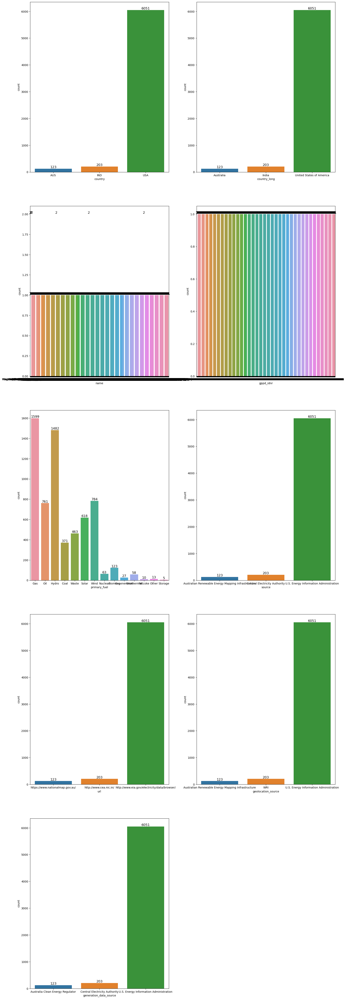

In [59]:
plt.figure(figsize =(20, 65))
plotnumber =1

for i in cat_col:
    if plotnumber <=10:
        plt.subplot(5, 2, plotnumber)
        ax =sns.countplot(x =i, data =df1)
        ax.bar_label(ax.containers[0], fontsize =12)
        plt.xlabel(i)
    plotnumber+=1
plt.show()

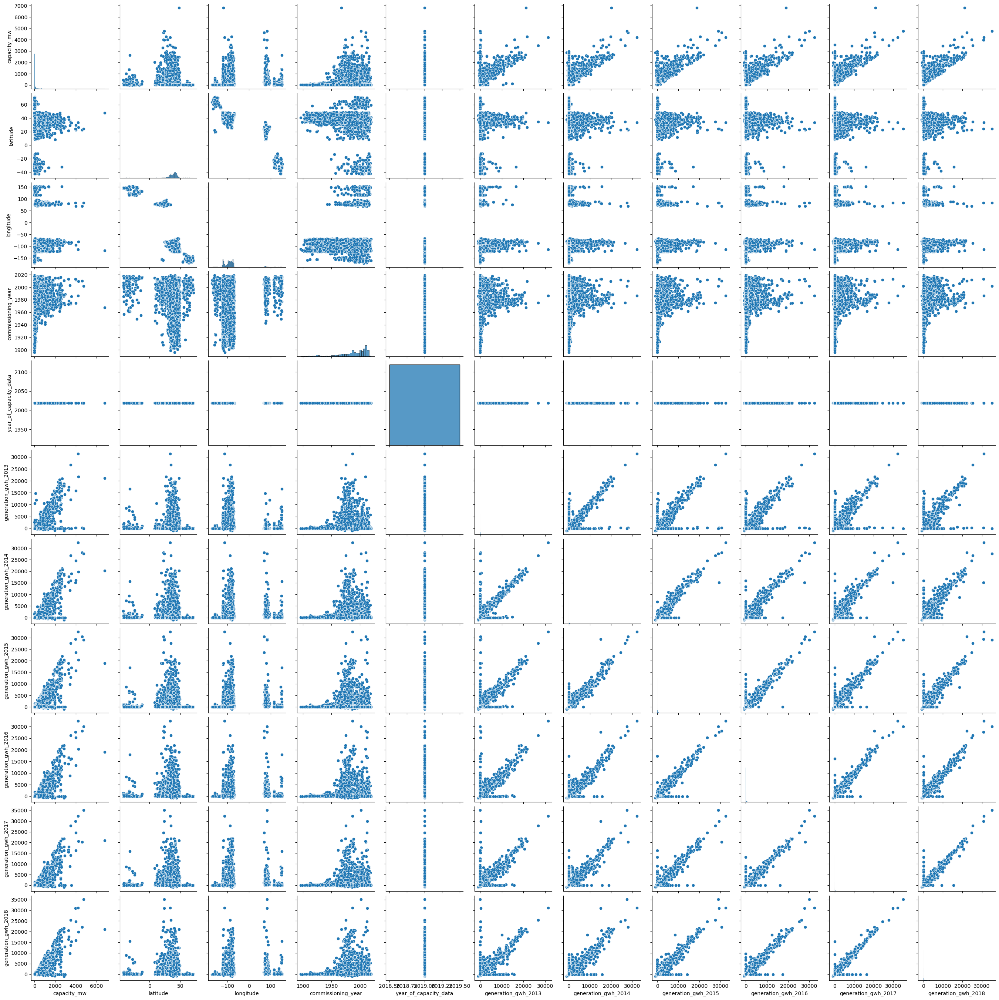

In [61]:
# Plotting pair plot
sns.pairplot(data =df1, palette ='Dark2')
plt.show()

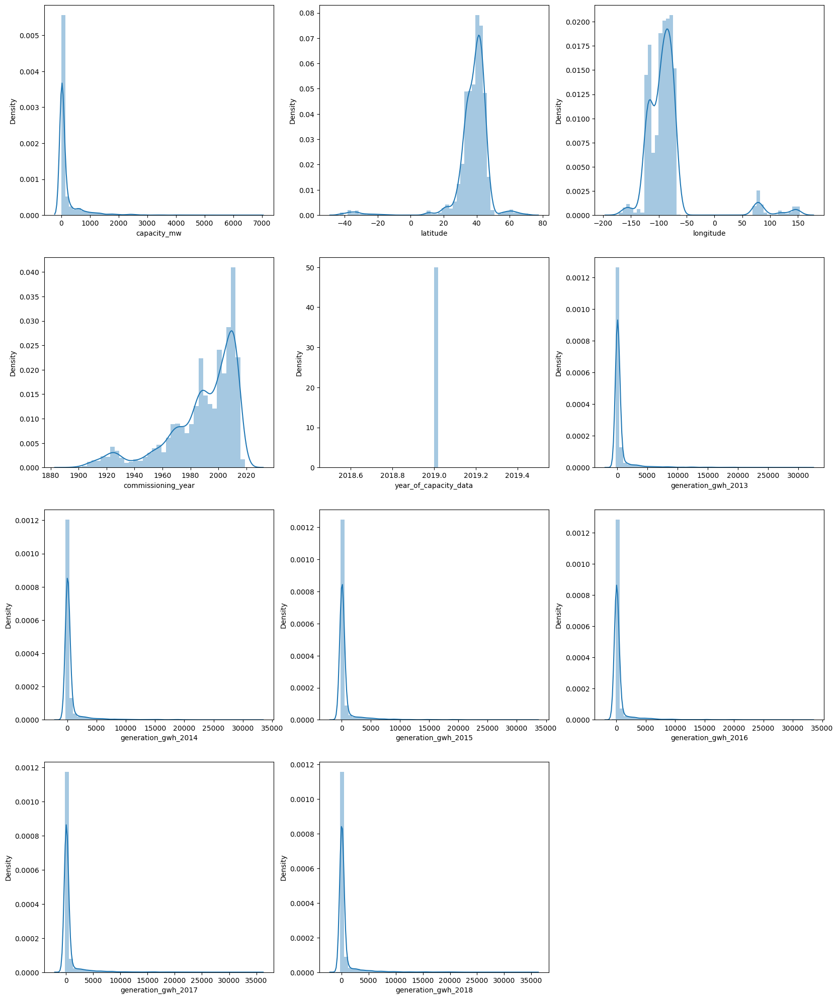

In [62]:
# Plotting displot to check data distribution
plt.figure(figsize =(20, 25))
plotnumber =1

for i in num_col:
    if plotnumber <=12:
        plt.subplot(4, 3, plotnumber)
        sns.distplot(df1[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show()

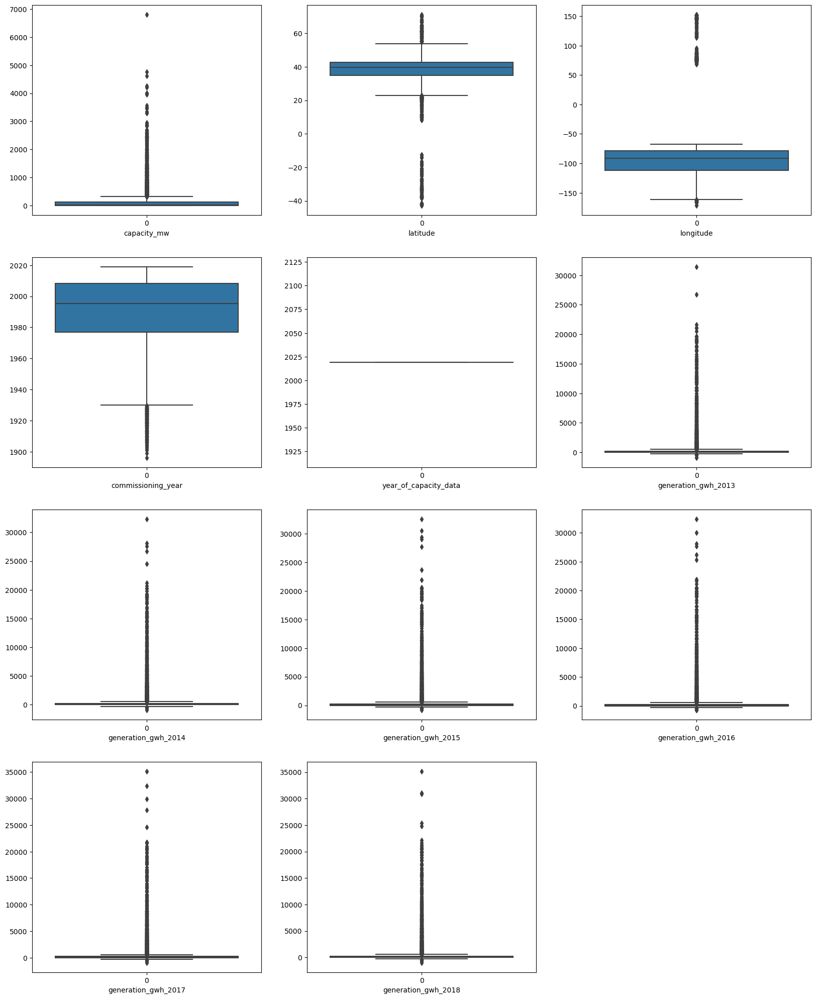

In [63]:
# Plotting boxplot to check outliers
plt.figure(figsize =(20, 25))
plotnumber =1

for i in num_col:
    if plotnumber <=12:
        plt.subplot(4, 3, plotnumber)
        sns.boxplot(df1[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show()

In [64]:
# Removing outliers using zscore
df_num =df1[['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018']]
print(df1.shape)
z =np.abs(zscore(df_num))
df1 =df1[(z <3).all(axis =1)]
print(df1.shape)

(6377, 20)
(5773, 20)


In [65]:
num_col

['capacity_mw',
 'latitude',
 'longitude',
 'commissioning_year',
 'year_of_capacity_data',
 'generation_gwh_2013',
 'generation_gwh_2014',
 'generation_gwh_2015',
 'generation_gwh_2016',
 'generation_gwh_2017',
 'generation_gwh_2018']

In [66]:
#Checking skewness
df1[num_col].skew()

capacity_mw              2.969642
latitude                 0.692622
longitude               -0.773027
commissioning_year      -1.267662
year_of_capacity_data    0.000000
generation_gwh_2013      4.488701
generation_gwh_2014      4.529753
generation_gwh_2015      4.414278
generation_gwh_2016      4.624297
generation_gwh_2017      4.619379
generation_gwh_2018      4.599526
dtype: float64

In [67]:
# Removing skewness
df1['capacity_mw'] =np.cbrt(df1['capacity_mw'])
df1['latitude'] =np.cbrt(df1['latitude'])
df1['longitude'] =np.cbrt(df1['longitude'])
df1['commissioning_year'] =np.cbrt(df1['commissioning_year'])
df1['generation_gwh_2013'] =np.cbrt(df1['generation_gwh_2013'])
df1['generation_gwh_2014'] =np.cbrt(df1['generation_gwh_2014'])
df1['generation_gwh_2015'] =np.cbrt(df1['generation_gwh_2015'])
df1['generation_gwh_2016'] =np.cbrt(df1['generation_gwh_2016'])
df1['generation_gwh_2017'] =np.cbrt(df1['generation_gwh_2017'])
df1['generation_gwh_2018'] =np.cbrt(df1['generation_gwh_2018'])

In [68]:
#Again checking skewness
df1[num_col].skew()

capacity_mw              1.249832
latitude                -0.006519
longitude               -0.487159
commissioning_year      -1.284502
year_of_capacity_data    0.000000
generation_gwh_2013      1.443556
generation_gwh_2014      1.441455
generation_gwh_2015      1.476574
generation_gwh_2016      1.438220
generation_gwh_2017      1.430404
generation_gwh_2018      1.444498
dtype: float64

In [69]:
# Again Removing skewness
df1['capacity_mw'] =np.cbrt(df1['capacity_mw'])
df1['commissioning_year'] =np.cbrt(df1['commissioning_year'])
df1['generation_gwh_2013'] =np.cbrt(df1['generation_gwh_2013'])
df1['generation_gwh_2014'] =np.cbrt(df1['generation_gwh_2014'])
df1['generation_gwh_2015'] =np.cbrt(df1['generation_gwh_2015'])
df1['generation_gwh_2016'] =np.cbrt(df1['generation_gwh_2016'])
df1['generation_gwh_2017'] =np.cbrt(df1['generation_gwh_2017'])
df1['generation_gwh_2018'] =np.cbrt(df1['generation_gwh_2018'])

In [70]:
#Again checking skewness
df1[num_col].skew()

capacity_mw              0.589902
latitude                -0.006519
longitude               -0.487159
commissioning_year      -1.290137
year_of_capacity_data    0.000000
generation_gwh_2013     -1.014986
generation_gwh_2014     -1.093654
generation_gwh_2015     -1.068190
generation_gwh_2016     -1.077325
generation_gwh_2017     -1.043641
generation_gwh_2018     -1.015624
dtype: float64

In [71]:
# Encoding categorical columns using ordinal encoder
from sklearn.preprocessing import OrdinalEncoder
OE =OrdinalEncoder()
for i in df1.columns:
    if df1[i].dtypes=='object':
        df1[i] =OE.fit_transform(df1[i].values.reshape(-1, 1))
        
df1

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,source,url,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_data_source
326,0.0,0.0,0.0,5767.0,1.073922,3.425651,-4.209203,10.0,2.328465,0.0,0.0,0.0,2019.0,1.102906,1.099587,1.103685,1.106779,1.095685,1.091944,0.0
327,0.0,0.0,1.0,4646.0,1.029581,3.233065,-4.908211,10.0,2.328337,0.0,0.0,0.0,2019.0,1.048234,1.088717,1.047239,1.053024,1.057929,1.088153,0.0
328,0.0,0.0,2.0,4754.0,1.159900,3.435154,-4.205723,10.0,2.328337,0.0,0.0,0.0,2019.0,1.196767,1.182594,1.190457,1.197162,1.190924,1.185528,0.0
329,0.0,0.0,3.0,1966.0,1.172870,3.473498,-4.465524,3.0,2.326918,0.0,0.0,0.0,2019.0,0.842998,0.825493,0.864961,0.876714,0.862450,0.865315,0.0
330,0.0,0.0,4.0,5311.0,1.073922,3.434598,-4.204757,10.0,2.328465,0.0,0.0,0.0,2019.0,1.118553,1.111246,1.108447,1.114785,1.109467,1.101446,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6372,0.0,0.0,5765.0,3521.0,2.034311,3.489153,-4.446190,3.0,2.327220,0.0,0.0,0.0,2019.0,0.000000,1.586451,1.720988,1.964356,0.000000,2.004486,0.0
6373,0.0,0.0,5766.0,4317.0,1.241366,3.489227,-4.446040,12.0,2.327306,0.0,0.0,0.0,2019.0,1.521095,1.541457,1.532776,1.516734,1.500976,1.461889,0.0
6374,0.0,0.0,5767.0,624.0,1.378716,3.370221,-4.408906,3.0,2.322883,0.0,0.0,0.0,2019.0,0.837636,0.753181,1.006284,0.734212,0.627110,-0.747657,0.0
6375,0.0,0.0,5768.0,4882.0,1.145653,3.500324,-4.253737,13.0,2.328465,0.0,0.0,0.0,2019.0,1.155457,1.105198,1.106631,1.058635,1.023590,1.113427,0.0


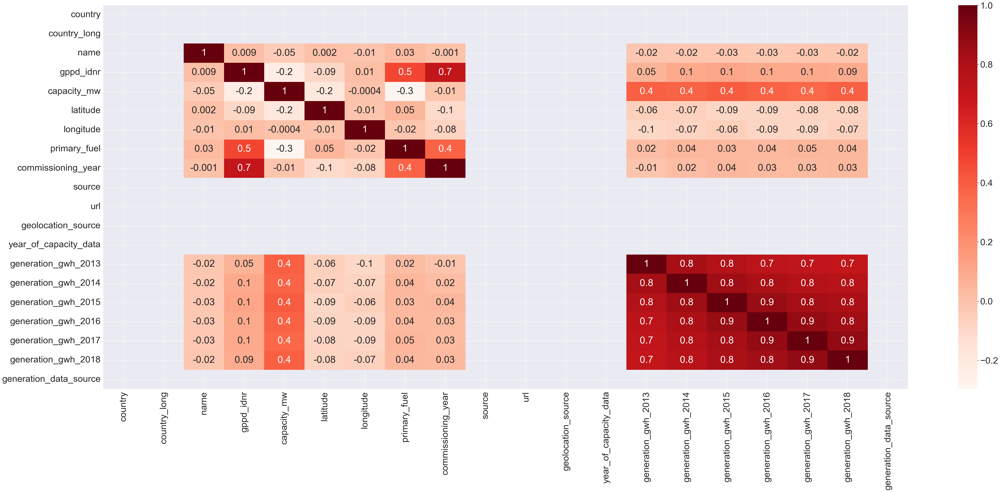

In [72]:
# Plotting heatmap
plt.figure(figsize=(65,25))
sns.set(font_scale =3)
sns.heatmap(df1.corr(), annot=True, fmt ='.1g', cmap="Reds", annot_kws ={"size" :35})
plt.show()

In [73]:
# Deleting longitude, latitude, generation_gwh_2014, country_long, source, generation_gwh_2016, generation_gwh_2017
df1.drop(columns =['longitude', 'latitude', 'generation_gwh_2014', 'country_long','generation_gwh_2016', 'generation_gwh_2017','generation_gwh_2017'], inplace =True)

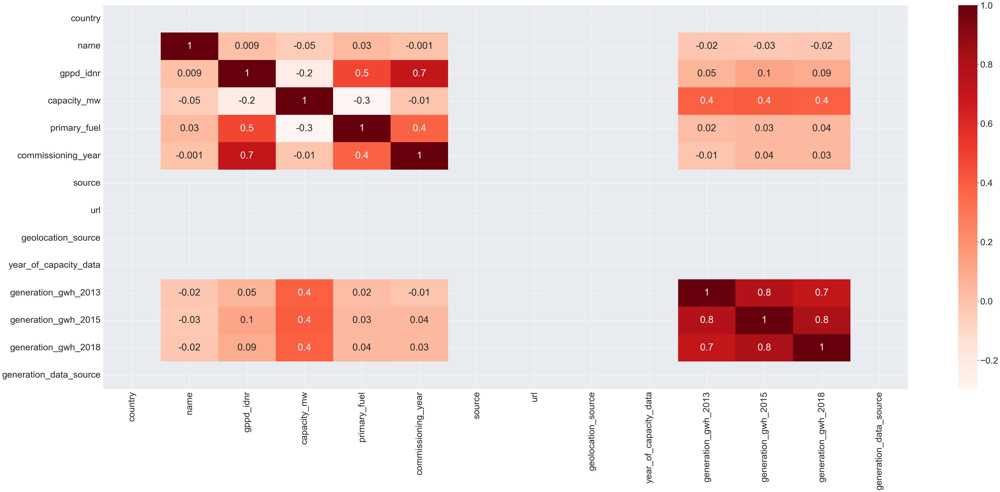

In [74]:
# Plotting heatmap
plt.figure(figsize=(65,25))
sns.set(font_scale =3)
sns.heatmap(df1.corr(), annot=True, fmt ='.1g', cmap="Reds", annot_kws ={"size" :35})
plt.show()

In [75]:
for i in df1:
    print(df1[i].value_counts())

country
0.0    5773
Name: count, dtype: int64
name
2258.0    2
839.0     2
4668.0    2
0.0       1
3845.0    1
         ..
1922.0    1
1921.0    1
1920.0    1
1919.0    1
5769.0    1
Name: count, Length: 5770, dtype: int64
gppd_idnr
5767.0    1
1747.0    1
4120.0    1
2184.0    1
5745.0    1
         ..
2654.0    1
2412.0    1
2984.0    1
3210.0    1
5757.0    1
Name: count, Length: 5773, dtype: int64
capacity_mw
1.000000    157
1.080060    129
1.195813    105
1.046082     86
1.129831     83
           ... 
1.533507      1
2.154435      1
1.844649      1
1.841814      1
2.034311      1
Name: count, Length: 1697, dtype: int64
primary_fuel
3.0     1474
5.0     1280
13.0     768
7.0      748
10.0     615
12.0     448
1.0      200
0.0      123
4.0       58
2.0       27
8.0       13
9.0        9
6.0        5
11.0       5
Name: count, dtype: int64
commissioning_year
2.328465    352
2.328594    292
2.328337    245
2.328079    176
2.328208    152
           ... 
2.323569      1
2.323693      1

In [76]:
# Shuffling dataset
df1 =df1.sample(frac =1)

## Data standardization using StandardScaler

In [77]:
# Seperating features and label
x =df1.drop(columns =['primary_fuel'])
y =df1[['primary_fuel']]

In [78]:
scaler =StandardScaler()
x =pd.DataFrame(scaler.fit_transform(x), columns =x.columns)
x

,country,name,gppd_idnr,capacity_mw,commissioning_year,source,url,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2015,generation_gwh_2018,generation_data_source
0,0.0,-0.719457,-1.114297,-0.046857,-1.417261,0.0,0.0,0.0,0.0,0.549309,0.491932,0.537204,0.0
1,0.0,-1.617618,-0.347430,-0.517385,-0.089081,0.0,0.0,0.0,0.0,-1.905218,-1.837777,-1.825162,0.0
2,0.0,1.205345,0.195617,0.786756,0.404088,0.0,0.0,0.0,0.0,0.750122,0.718290,0.719929,0.0
3,0.0,-0.573566,-0.618054,0.766485,-0.254060,0.0,0.0,0.0,0.0,0.928257,0.961592,0.959810,0.0
4,0.0,1.489923,-0.773467,0.542783,-0.274703,0.0,0.0,0.0,0.0,0.925603,0.800496,0.771449,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5768,0.0,-0.024223,-1.415523,-0.669879,0.102571,0.0,0.0,0.0,0.0,-0.908683,-0.818125,-0.787603,0.0
5769,0.0,0.797690,0.842473,-0.455907,0.772241,0.0,0.0,0.0,0.0,0.198832,0.179770,0.175705,0.0
5770,0.0,0.816302,0.295826,2.173502,0.526969,0.0,0.0,0.0,0.0,1.554455,1.652269,1.641792,0.0
5771,0.0,-1.606211,-0.846674,-1.075896,-1.588447,0.0,0.0,0.0,0.0,-0.033220,0.061897,0.037660,0.0


In [79]:
# Checking VIF score
vif =pd.DataFrame()
vif['VIF Values'] =[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] =x.columns
vif

,VIF Values,Features
0,NaN,country
1,1.002349,name
2,2.401575,gppd_idnr
3,1.454424,capacity_mw
4,2.169583,commissioning_year
5,NaN,source
6,NaN,url
7,NaN,geolocation_source
8,NaN,year_of_capacity_data
9,2.734659,generation_gwh_2013


In [80]:
# Deleting vif score with NaN values
df1.drop(columns =['country', 'source', 'url', 'geolocation_source', 'generation_data_source'], inplace =True)

# EDA part completed

## Model building

### Finding best random state

In [82]:
maxrs =0
maxacc =0

for i in range (1, 200):
    x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =i)
    RFC =RandomForestClassifier()
    RFC.fit(x_train, y_train)
    pred =RFC.predict(x_test)
    acc =accuracy_score(y_test, pred)
    
    if acc > maxacc:
        maxacc =acc
        maxrs =i
        
print("Maximum accuracy is :", maxacc, "at random state :", maxrs)

Maximum accuracy is : 0.7881062355658198 at random state : 68


In [83]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =maxrs)

In [87]:
RFR =RandomForestClassifier()
ETC =ExtraTreesClassifier()
LR =LogisticRegression()
svc =SVC()
GBC =GradientBoostingClassifier()
ABC =AdaBoostClassifier()
BC =BaggingClassifier()
DTC =DecisionTreeClassifier()
knn =KNeighborsClassifier()

In [88]:
models ={'RandomForestClassifier': RFR,
        'ExtraTreesClassifier': ETC,
        'LogisticRegression': LR,
        'SVC': svc,
        'GradientBoostigClassifier': GBC,
        'AdaBoostClassifier': ABC,
        'BaggingClassifier': BC,
        'DecisionTreeClassifier': DTC,
        'KneighborsClassifier': knn}

for name, model in models.items():
    model.fit(x_train, y_train)
    pred =model.predict(x_test)
    acc =accuracy_score(y_test, pred)
    
    print(name)
    print("Accuracy Score: ", acc*100)
    print("Confusion Matrix:\n", confusion_matrix(y_test, pred))
    print("Classification Report :\n", classification_report(y_test, pred))
    
    print("\nCross Validation :")
    print("*"*20)
    score =cross_val_score(model, x, y, cv =5)
    print(score)
    print(score.mean())
    print("Difference between accuracy score and cross validation is :", (acc-(score.mean()))*100)
    print('\n')
    print("="*50)
    print('\n')

RandomForestClassifier
Accuracy Score:  78.75288683602771
Confusion Matrix:
 [[  5   0   0  17   0   2   0   0   0   4   0   6   2]
 [  0  30   0  16   0   3   1   0   0   0   0   4   1]
 [  0   0   0   4   0   0   0   0   0   0   0   1   2]
 [  1   3   0 330   0  13  41   0   0   6   0  19  16]
 [  0   2   0   5   2   2   0   0   0   1   0   5   3]
 [  0   4   0  16   2 374   3   0   0   1   0   5   2]
 [  1   1   0  30   0   6 183   0   0   2   0   0   1]
 [  0   0   0   4   0   1   0   0   0   0   0   0   0]
 [  0   0   0   3   0   1   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   2   0   0 180   0   0  10]
 [  0   0   0   0   0   0   1   0   0   0   0   0   0]
 [  0   0   0  33   0   9   1   0   0   7   0  79   8]
 [  1   0   0   7   0   4   2   0   0  17   0   3 181]]
Classification Report :
               precision    recall  f1-score   support

         0.0       0.62      0.14      0.23        36
         1.0       0.75      0.55      0.63        55
         2.0       

__RandomForestClassifier is our best model, giving highest accuracy of 78.75%.__

## Hyperparameter Tunning

In [89]:
parameters ={ 
    'n_estimators': [25, 50, 100, 150], 
    'max_features': ['sqrt', 'log2', None], 
    'max_depth': [3, 6, 9], 
    'max_leaf_nodes': [3, 6, 9], 
} 

In [91]:
GCV =GridSearchCV(RandomForestClassifier(), parameters, cv =5)
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [3, 6, 9],
                         'max_features': ['sqrt', 'log2', None],
                         'max_leaf_nodes': [3, 6, 9],
                         'n_estimators': [25, 50, 100, 150]})

In [92]:
GCV.best_params_

{'max_depth': 9,
 'max_features': 'log2',
 'max_leaf_nodes': 9,
 'n_estimators': 100}

In [96]:
RFC =RandomForestClassifier(max_depth =9,
                           max_features ='log2',
                           max_leaf_nodes =9,
                           n_estimators =100)
RFC.fit(x_train, y_train)
pred =RFC.predict(x_test)
acc =accuracy_score(y_test, pred)
print("Accuracy is :", acc*100)

Accuracy is : 67.8406466512702


__Accuracy does not increase after hyperparamater tunning. We will go the the default parameter.__

In [98]:
Final_model =RandomForestClassifier()
Final_model.fit(x_train, y_train)
pred =Final_model.predict(x_test)
acc =accuracy_score(y_test, pred)
print("Accuracy for Random Forest Classifier is :", acc*100)

Accuracy for Random Forest Classifier is : 77.94457274826789


__Saving the model.__

In [99]:
#Saving the model
pickle.dump(Final_model, open('Primary_Fuel.pkl', 'wb'))

In [100]:
# Loading the model
loaded_model =pickle.load(open('Primary_Fuel.pkl', 'rb'))
pred =loaded_model.predict(x_test)
acc =accuracy_score(y_test, pred)
print("Accuracy is :",acc*100)

Accuracy is : 77.94457274826789


In [113]:
# Comparing Actual Vs Predicted
act =np.array(y_test)
df_pred =pd.DataFrame()
df_pred['Predicted'] =pred
df_pred['Actual'] =act
df_pred

,Predicted,Actual
0,13.0,13.0
1,3.0,3.0
2,5.0,5.0
3,5.0,5.0
4,10.0,10.0
...,...,...
1727,10.0,10.0
1728,3.0,3.0
1729,3.0,3.0
1730,3.0,12.0
